## 1.0 Imports e Funções

### 1.1 Imports

In [2]:
import pandas as pd
import numpy as np
import inflection
import seaborn as sns
import matplotlib.pyplot as plt 
import association_metrics as am
import pickle
import category_encoders as ce
import random
from sklearn.model_selection import train_test_split
from sklearn import preprocessing   as pp
from IPython.display import Image, display
from plotnine import (
                        ggplot,
                        aes,
                        after_stat,
                        stage,
                        geom_bar,
                        geom_text,
                        geom_label,
                        position_dodge2,
                        facet_wrap)
import plotly.express as px
from scipy import stats as ss
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
import scikitplot as skplt
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from flask import Flask, request, Response
import json
import requests

### 1.2 Funções

In [2]:
def prop_per_x(x, count):
    """
    Compute the proportion of the counts for each value of x
    """
    df = pd.DataFrame({
        'x': x,
        'count': count
    })
    prop = df['count']/df.groupby('x')['count'].transform('sum')
    return prop

def cramer_v( x, y ):
    cm = pd.crosstab( x, y ).values
    n = cm.sum()
    r, k = cm.shape
    chi2 = ss.chi2_contingency( cm )[0]
    chi2corr = max( 0, chi2 - (k-1)*(r-1)/(n-1) )
    kcorr = k - (k-1)**2/(n-1)
    rcorr = r - (r-1)**2/(n-1)
    return np.sqrt( (chi2corr/n) / ( min( kcorr-1, rcorr-1 ) ))


def precision_recall_at_k (df, k=2000, target = 'response', proba = 'score', model = 'none'):

    df = df.sort_values(proba, ascending = False)
    df = df.reset_index (drop= True)
    df['ranking'] =  df.index + 1
    df['precision_at_k'] = df[target].cumsum() / df['ranking']  
    df['recall_at_k'] = df[target].cumsum() / df[target].sum()
    df['model'] = model
    
    return df.loc[[k-1],['model', 'ranking','precision_at_k','recall_at_k']]

def cross_validation (model,  X, y, topk = 9146, kfold =10):
    #Listas para os resultados de performance
    precision_at_k = []
    recall_at_k = []
    #Kfold Cross validation
    kf = KFold(n_splits=kfold)
    for train, test in kf.split(X,y):
        x_cv_train, x_cv_val = X.iloc[train], X.iloc[test]
        y_cv_train, y_cv_val = y.iloc[train], y.iloc[test]
        
        #treino
        model.fit(x_cv_train, y_cv_train)
        
        #previsao
        yhat_proba = model.predict_proba(x_cv_val)
        
        #performance
        df_perf = x_cv_val.copy()
        df_perf['response'] = y_cv_val.copy()
        df_perf['score'] = yhat_proba[:,1].tolist()
        performance = precision_recall_at_k(df_perf,k=topk, proba='score', model = 'None')
        precision_at_k.append(performance['precision_at_k'].item())
        recall_at_k.append(performance['recall_at_k'].item())
    #resultados
    df_results = pd.DataFrame([[np.mean(precision_at_k),np.std(precision_at_k)],
                       [np.mean(recall_at_k), np.std(recall_at_k)]],columns = ["mean", "std"])
    df_results.index = ["precision_at_k","recall_at_k"]

    return(df_results)

## 2.0 Carregamento dos Dados

In [3]:
#Dados para treino e teste
df1 = pd.read_csv('data/train_raw.csv')
#Simulação dos dados de produção
df_prod = pd.read_csv('data/test_raw.csv')

In [4]:
df1.head()

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1
3,4,Male,21,1,11.0,1,< 1 Year,No,28619.0,152.0,203,0
4,5,Female,29,1,41.0,1,< 1 Year,No,27496.0,152.0,39,0


## 3.0 Descrição dos Dados

### 3.1 Renomear Colunas

In [5]:
df1.columns

Index(['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response'],
      dtype='object')

In [6]:
old_cols = ['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage', 'Response']
snakecase = lambda x:inflection.underscore(x)
new_cols = list(map(snakecase, old_cols))
df1.columns = new_cols

### 3.2 Informação sobre os dados

In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   gender                381109 non-null  object 
 2   age                   381109 non-null  int64  
 3   driving_license       381109 non-null  int64  
 4   region_code           381109 non-null  float64
 5   previously_insured    381109 non-null  int64  
 6   vehicle_age           381109 non-null  object 
 7   vehicle_damage        381109 non-null  object 
 8   annual_premium        381109 non-null  float64
 9   policy_sales_channel  381109 non-null  float64
 10  vintage               381109 non-null  int64  
 11  response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


### 3.3 Conversão dos dados

In [8]:
#region_code para int
df1['region_code'] = df1['region_code'].astype(int)

#policy_sales_channel para int
df1['policy_sales_channel'] = df1['policy_sales_channel'].astype(int)

### 3.4 Fill NA


In [9]:
#Não existem dados Nulos

### 3.5 Estatística  Descritiva

In [10]:
df_num = df1[['age','annual_premium','vintage', 'response']]
df_cat = df1[['gender','region_code','policy_sales_channel','driving_license', 'vehicle_age', 'vehicle_damage', 'previously_insured', 'response']]

In [11]:
df_num.describe(percentiles= [.25, .5, .75, .90,.95, .99]).apply(lambda s: s.apply('{0:.5f}'.format))

,age,annual_premium,vintage,response
count,381109.00000,381109.00000,381109.00000,381109.00000
mean,38.82258,30564.38958,154.34740,0.12256
std,15.51161,17213.15506,83.67130,0.32794
min,20.00000,2630.00000,10.00000,0.00000
25%,25.00000,24405.00000,82.00000,0.00000
50%,36.00000,31669.00000,154.00000,0.00000
75%,49.00000,39400.00000,227.00000,0.00000
90%,62.00000,48431.00000,270.00000,1.00000
95%,69.00000,55176.00000,285.00000,1.00000
99%,77.00000,72963.00000,297.00000,1.00000


In [12]:
df_num.skew()

age               0.672539
annual_premium    1.766087
vintage           0.003030
response          2.301906
dtype: float64

In [13]:
df_num.kurtosis()

age               -0.565655
annual_premium    34.004569
vintage           -1.200688
response           3.298788
dtype: float64

### 3.6 Train-Test Split

In [14]:
X = df1.drop('response', axis = 1).copy()
y = df1['response'].copy()

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42, stratify = y)

In [15]:
df1_train = pd.concat([X_train, y_train], axis = 1)

df_test = pd.concat([X_test, y_test], axis = 1)

In [16]:
#Validando estratificação dos dados de teste
df_test['response'].value_counts() / df_test['response'].count() 

0    0.877437
1    0.122563
Name: response, dtype: float64

In [17]:
#Validando estratificação dos dados de teste
df1_train['response'].value_counts() / df1_train['response'].count() 

0    0.877437
1    0.122563
Name: response, dtype: float64

In [18]:
#Salvando dados
df1_train.to_csv('data/df1_train.csv')
df_test.to_csv('data/df_test_split.csv')

## 4.0 Hipóteses e Filtragem dos dados

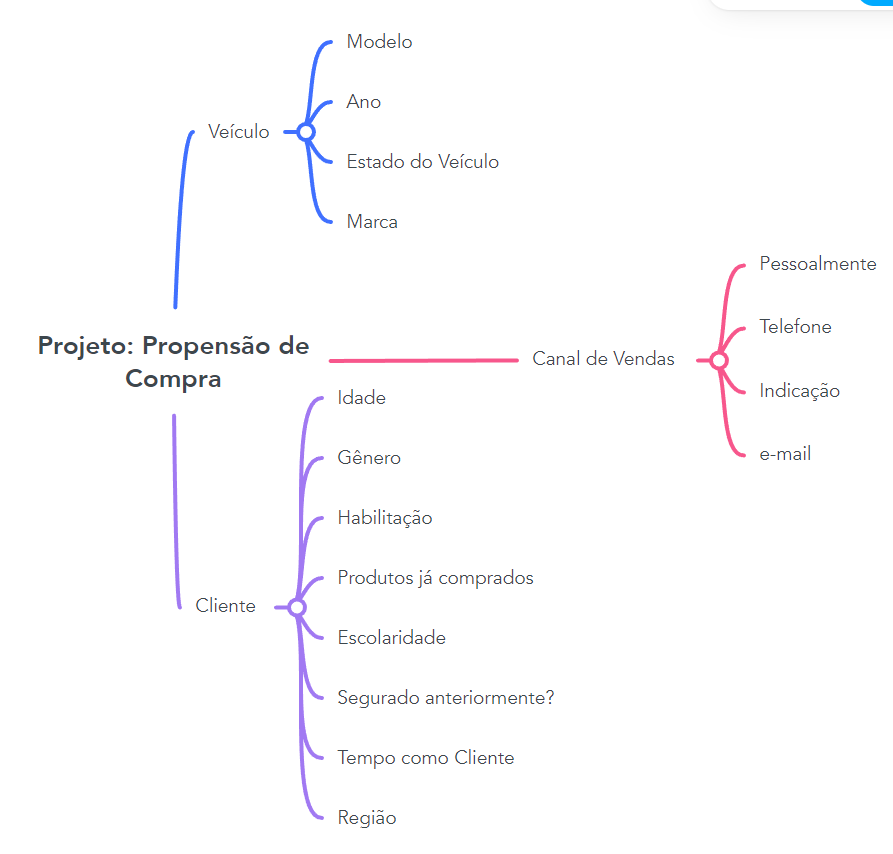

In [19]:
display(Image(filename='img/mapa_mental.png'))

### 4.1 Hipóteses

#### Hipóteses de Cliente

**1.** Clientes com o Gênero feminino estão mais propensas a adquirir um seguro veicular.

**2.** Clientes com maior escolaridade são mais propenso a adquirir um seguro veicular.

**3.** Clientes mais velhos são mais propenso a adquirir um seguro veicular.

**4.** Pessoas que possuem um maior tempo como cliente, são mais propensos a adquirir um seguro veicular.

**5.** Clientes não habilitados não adquirem seguros veiculares.

**6** A região de um cliente impacta diretamente se ele vai ou não adquirir um seguro veicular.

**7** Clientes que já possuiam um seguro veicular ativo são menos propensos a adquirir um seguro veicular.

#### Hipóteses de Veículos

**1.** Clientes com carros mais velhos são menos propensos a comprar um seguro.

**2.** Clientes que tiveram o carro danificado no passado são mais propensos a comprar um seguro.

**3.** A marca do veículo de um cliente impacta diretamente se ele vai ou não adquirir um seguro veicular.


#### Hipóteses de Canal de Vendas

**1.** Clientes que são indicados por outros clientes são mais propensos a adquirir um seguro veicular.

**2.** Clientes contatados pessoalmente são mais propensos a adquirir um seguro veicular.

**3.** Clientes contatdos por e-mail são menos propensos a adquirir um seguro veicular.

### 4.3 Filtragem dos Dados com base no negócio

##### Para esse projeto não iremos filtrar nenhum dado usando o conhecimento do negócio

## 5.0 Análise exploratória dos Dados

In [20]:
df2 = pd.read_csv('data/df1_train.csv',index_col=0)

### 5.1 Análise Univariada

#### 5.1.1 Variável Resposta

<AxesSubplot: xlabel='response', ylabel='count'>

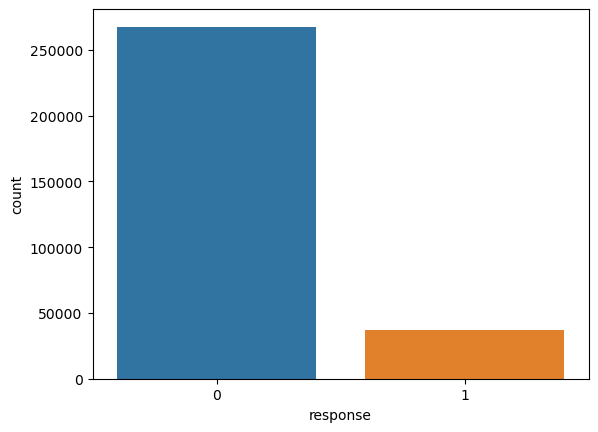

In [21]:
sns.countplot(x=df2['response'])

##### Como podemos ver os dados da variável resposta estão desbalanceados

#### 5.1.2 Distribuições

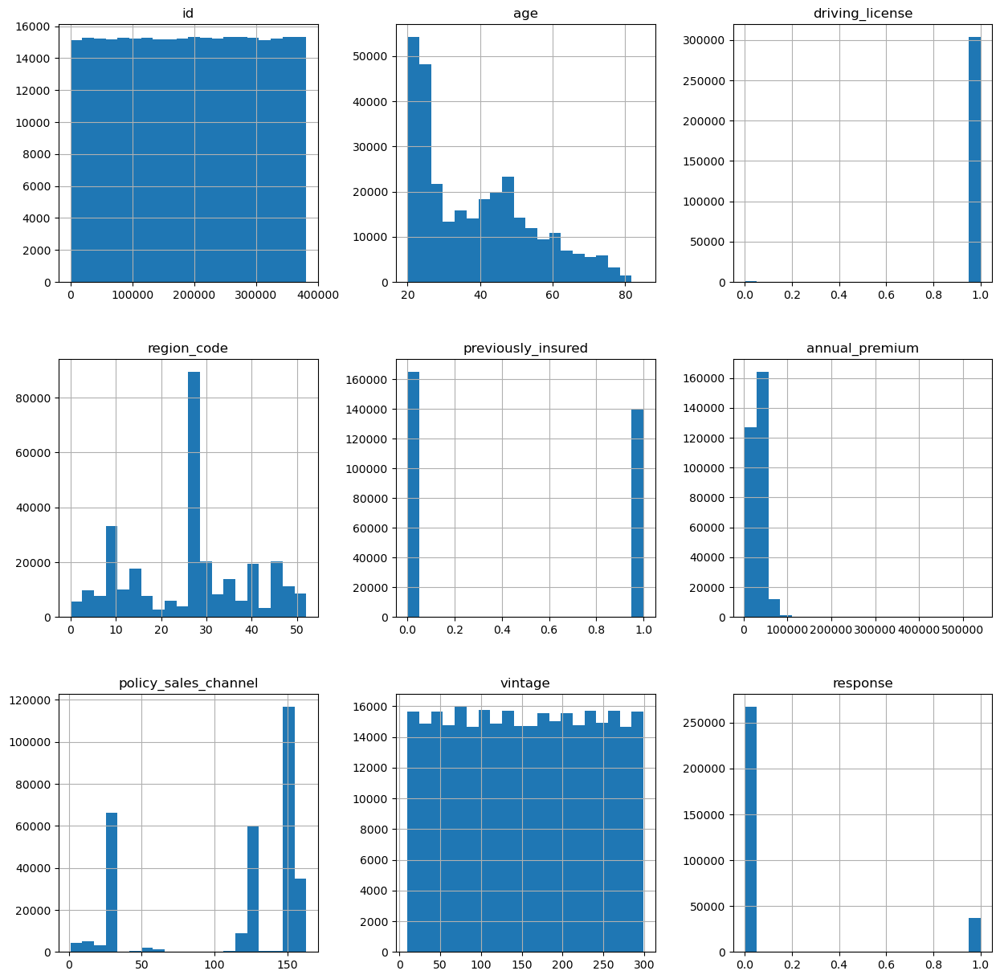

In [22]:
df2.hist(bins=20, figsize=[15,15]);

**Descobertas:**

**1.** Temos um grande número de clientes entre 20 e 30 anos

**2.** A imensa maioria dos clientes possuem habilitação

**3.** Temos um grande pico de clientes em uma região específica.


#### 5.1.3 Análise das Features Numéricas

<AxesSubplot: xlabel='response', ylabel='age'>

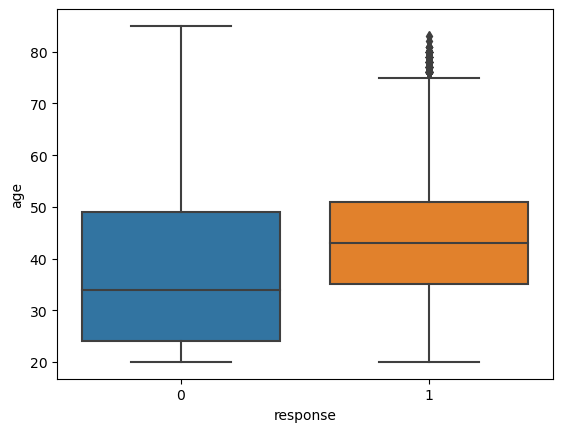

In [23]:
#Age - Aparentemente será relevante para nosso modelo, por discriminar um perfil de idade das pessoas que aceitaram
sns.boxplot(data=df2, x ='response', y='age')

<AxesSubplot: xlabel='age', ylabel='Count'>

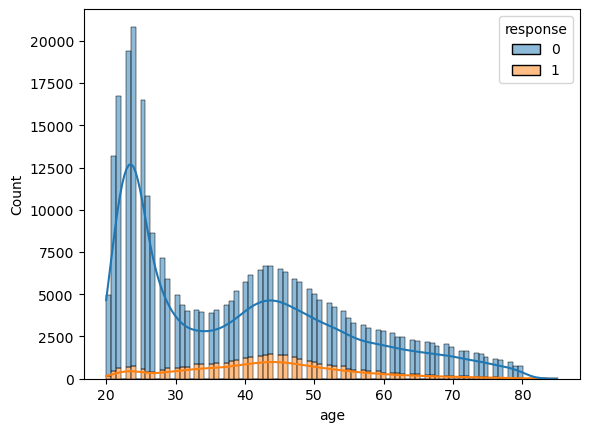

In [24]:
sns.histplot(data=df2, x='age', hue='response', multiple='stack', palette='tab10', kde=True)

<AxesSubplot: xlabel='response', ylabel='vintage'>

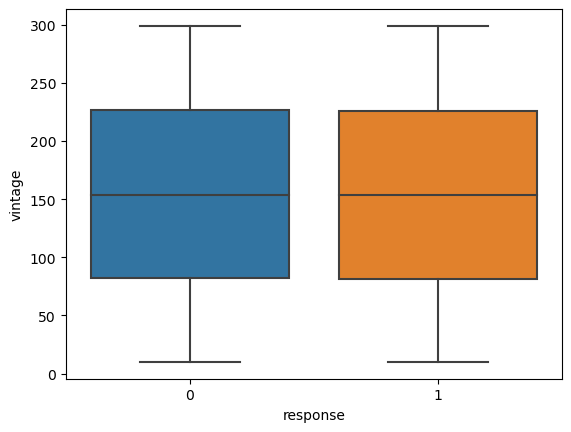

In [25]:
#vintage - Mão parece ser relevante de forma isolada para o nosso modelo
sns.boxplot(data=df2 , x ='response', y='vintage')

<AxesSubplot: xlabel='vintage', ylabel='Count'>

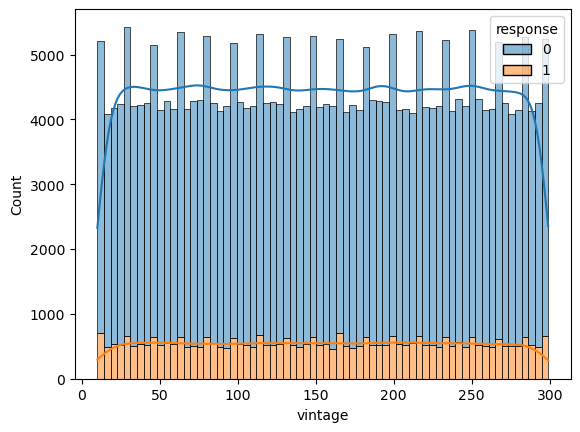

In [26]:
sns.histplot(data=df2, x='vintage', hue='response', multiple='stack', palette='tab10', kde=True)

<AxesSubplot: xlabel='response', ylabel='annual_premium'>

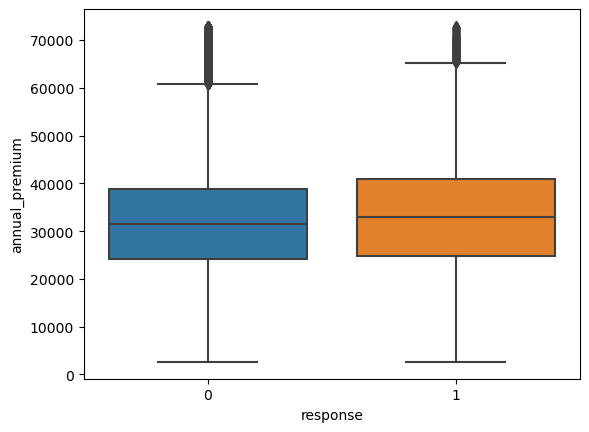

In [27]:
#annual_premium - Dados foram filtrados para melhor visualização (99% dos dados).
#Não parecem ser relevante de forma isolada para o nosso modelo
sns.boxplot(data=df2[df2['annual_premium'] < 72963] , x ='response', y='annual_premium')

<AxesSubplot: xlabel='annual_premium', ylabel='Count'>

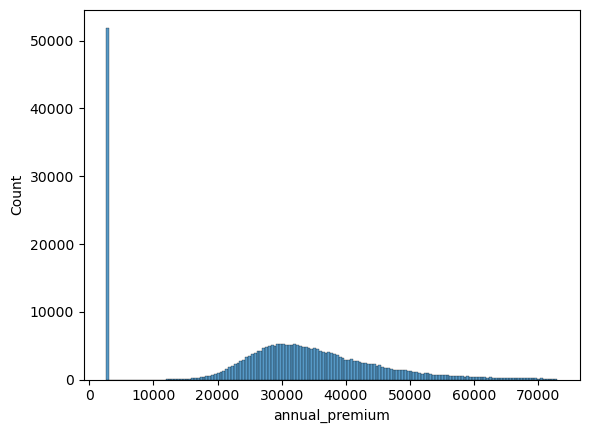

In [28]:
sns.histplot(data=df2[df2['annual_premium'] < 72963] , x ='annual_premium')

<AxesSubplot: xlabel='region_code', ylabel='id'>

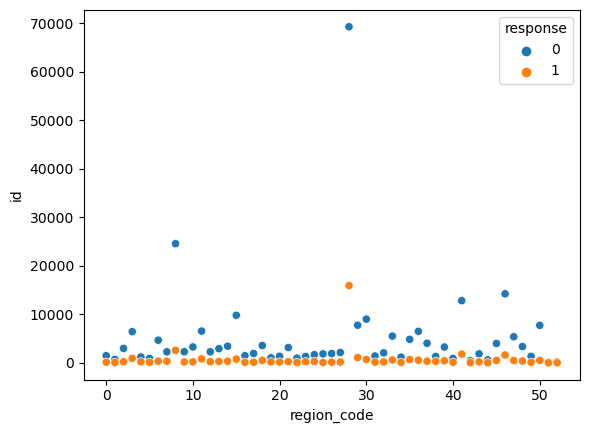

In [29]:
#region_code
sns.scatterplot(data= df2[['id', 'region_code', 'response']].groupby(['region_code','response']).count().reset_index(), hue = 'response', y='id', x='region_code')

<AxesSubplot: xlabel='policy_sales_channel', ylabel='id'>

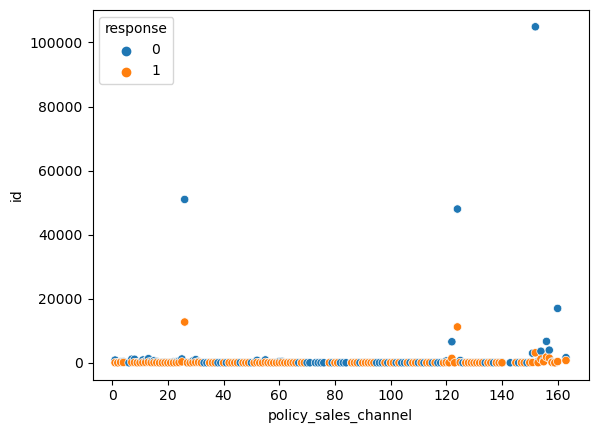

In [30]:
#policy_sales_channel
sns.scatterplot(data= df2[['id', 'policy_sales_channel', 'response']].groupby(['policy_sales_channel','response']).count().reset_index(), hue = 'response', y='id', x='policy_sales_channel')

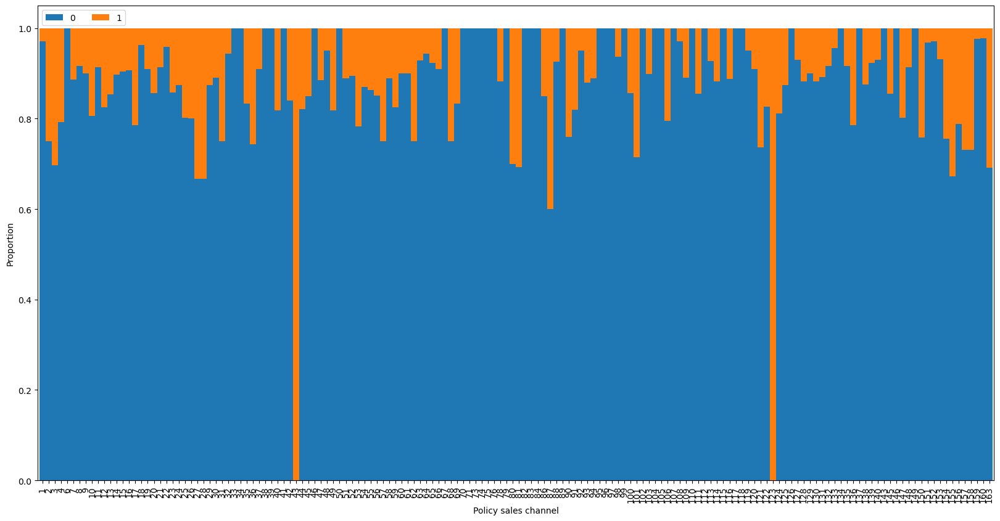

In [31]:
cross_tab_prop = pd.crosstab(index=df2['policy_sales_channel'],
                             columns=df2['response'],
                             normalize="index")
cross_tab_prop
cross_tab_prop.plot(kind='bar', 
                    stacked=True,  
                    figsize=(20,10),
                    width=1.0)
plt.legend(loc="upper left", ncol=2)
plt.xlabel("Policy sales channel")
plt.ylabel("Proportion")
plt.show()

#### 5.1.4 Análise das Features Categóricas

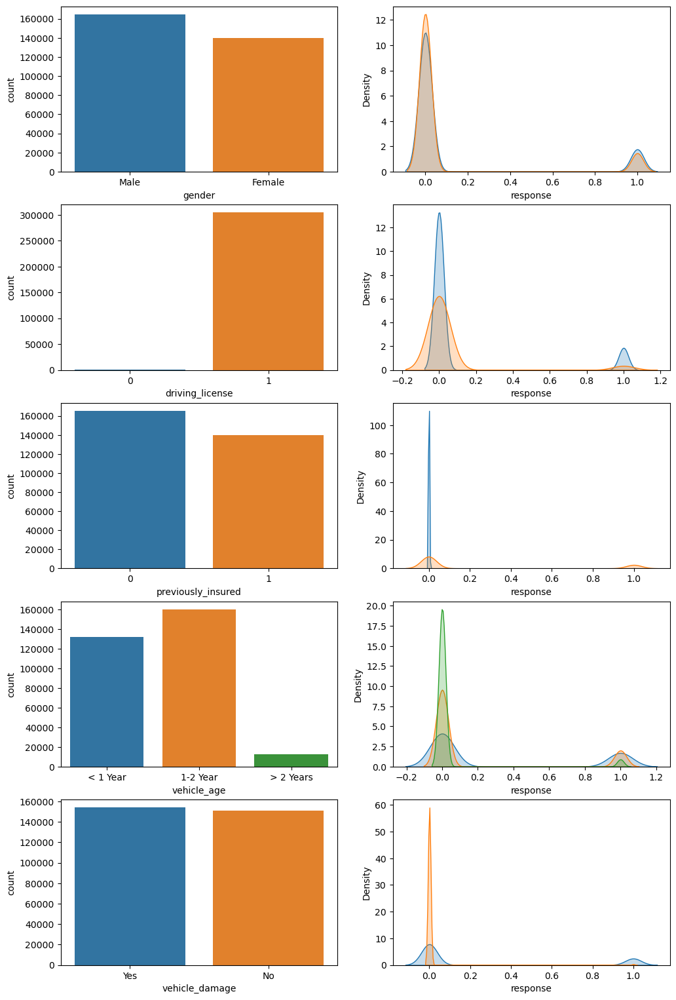

In [32]:
f = plt.figure(figsize=(12,19))

# Gender
f.add_subplot(521)
sns.countplot( x= df2['gender'] )

f.add_subplot(522)
sns.kdeplot( df2[df2['gender'] == 'Male']['response'],label='Male', fill=True )
sns.kdeplot( df2[df2['gender'] == 'Female']['response'],label='Female', fill=True )

# Driving License
f.add_subplot(523)
sns.countplot( x=df2['driving_license'] )

f.add_subplot(524)
sns.kdeplot( df2[df2['driving_license'] == 1]['response'], label='1', fill=True )
sns.kdeplot( df2[df2['driving_license'] == 0]['response'], label='0', fill=True )

# Previously Insured
f.add_subplot(525)
sns.countplot( x=df2['previously_insured'] )

f.add_subplot(526)
sns.kdeplot( df2[df2['previously_insured'] == 1]['response'], label='1', fill=True )
sns.kdeplot( df2[df2['previously_insured'] == 0]['response'], label='0', fill=True )

# Vehicle age
f.add_subplot(527)
sns.countplot( x=df2['vehicle_age'] )

f.add_subplot(528)
sns.kdeplot( df2[df2['vehicle_age'] == '> 2 Years']['response'], label='> 2 Years', fill=True )
sns.kdeplot( df2[df2['vehicle_age'] == '1-2 Year']['response'], label='1-2 Year', fill=True )
sns.kdeplot( df2[df2['vehicle_age'] == '< 1 Year']['response'], label='< 1 Year', fill=True )


# Vehicle Damage
f.add_subplot(529)
sns.countplot( x=df2['vehicle_damage'] )

f.add_subplot(5,2,10)
sns.kdeplot( df2[df2['vehicle_damage'] == 'Yes']['response'], label='Yes', fill=True )
sns.kdeplot( df2[df2['vehicle_damage'] == 'No']['response'], label='No', fill=True )


plt.show(f)

### 5.2 Análise Bivariada

**Hipótese 1.** Clientes com o Gênero feminino estão mais propensas a adquirir um seguro veicular.


**FALSA:** 60.9% das pessoas que compraram seguro são homens, indo um pouco mais a fundo, do total de mulheres contatadas apenas 10,43% compraram o seguro, enquanto que a porcentagem de homens que compraram foi de 13,81%

In [33]:
df2[['gender','response']].groupby('gender').count()

,response
gender,
Female,140107
Male,164780


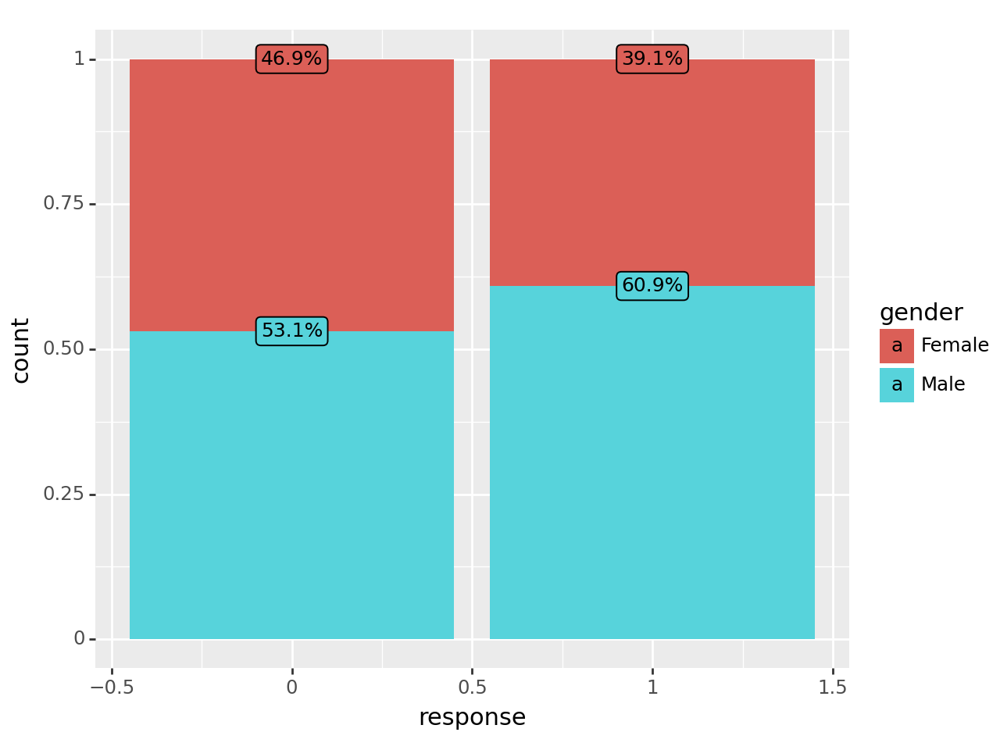

<Figure Size: (640 x 480)>

In [34]:
(ggplot(df2[['gender','response']], aes('response', fill='gender'))
     + geom_bar(position='fill')
     + geom_label(
                     aes(label=after_stat('prop_per_x(x, count) * 100')),
                     stat='count',
                     position='fill',
                     format_string='{:.1f}%',
                     size=9,)
)

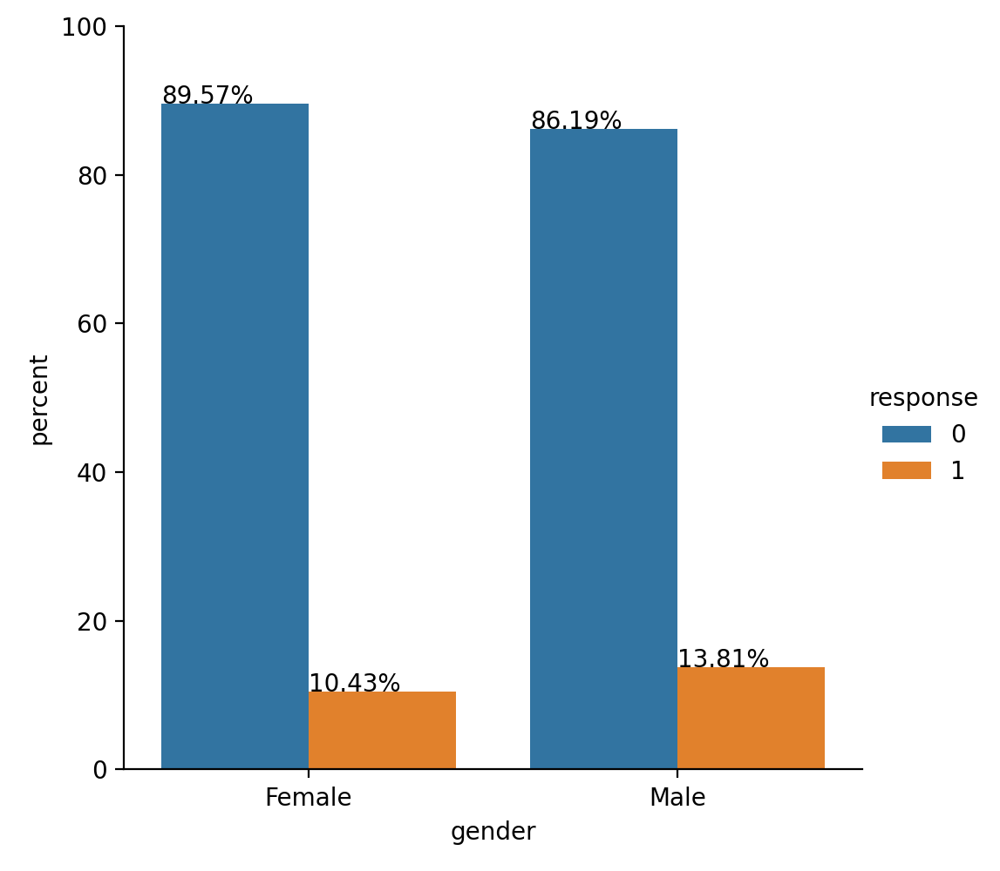

In [35]:
dfgraph = df2.groupby('gender')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='gender',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 2.** Clientes com carros mais velhos são menos propensos a comprar um seguro.


**FALSO:** Em números totais, apenas 10,1% das pessoas com carros com idade maior que 2 anos se mostraram interessadas no seguro, porém relativo a quantidade de amostras foi a que obteve maior número de interessados, 29,28% das pessoas com carros mais velhos que 2 anos disseram sim, contra 17,37% de pessoas com carros de 1 a 2 anos e 4,39% das pessoas com carros com até 1 ano. Porém um adendo é que o número de pessoas na base com carros maior que dois anos é muito inferior as outras duas categorias. Para validar completamente essa hipótese precisariamos de mais amostras de clientes com carros mais velhos que 2 anos.

In [36]:
df2[['vehicle_age','response']].groupby('vehicle_age').count()

,response
vehicle_age,
1-2 Year,160195
< 1 Year,131852
> 2 Years,12840


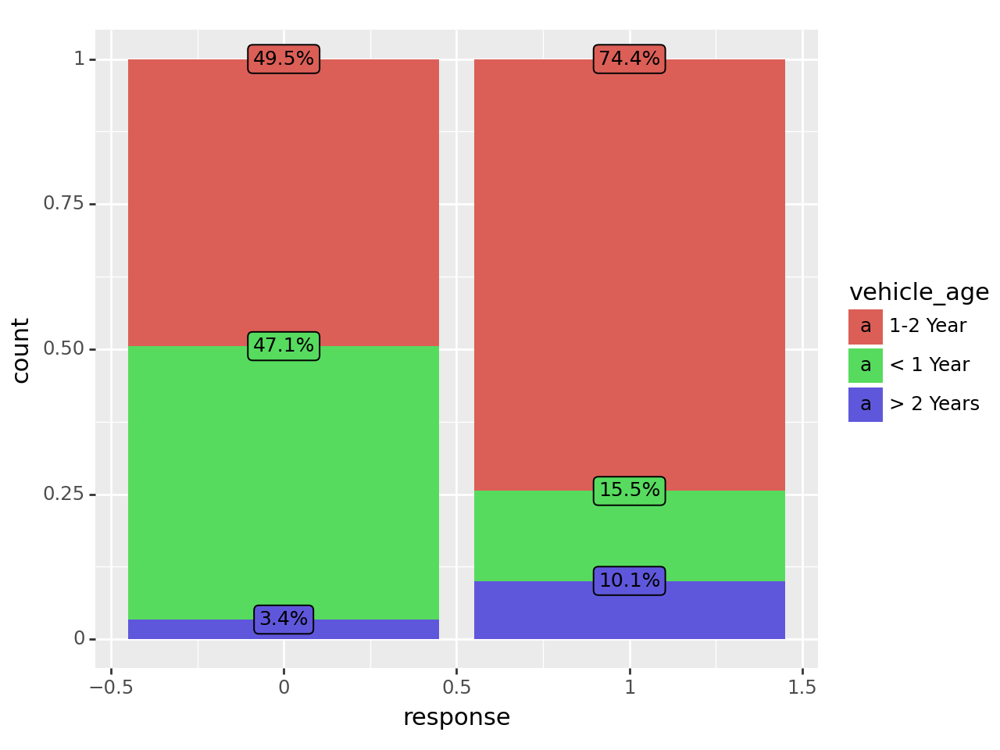

<Figure Size: (640 x 480)>

In [37]:
(ggplot(df2[['vehicle_age','response']], aes('response', fill='vehicle_age'))
     + geom_bar(position='fill')
     + geom_label(
                     aes(label=after_stat('prop_per_x(x, count) * 100')),
                     stat='count',
                     position='fill',
                     format_string='{:.1f}%',
                     size=9,)
)

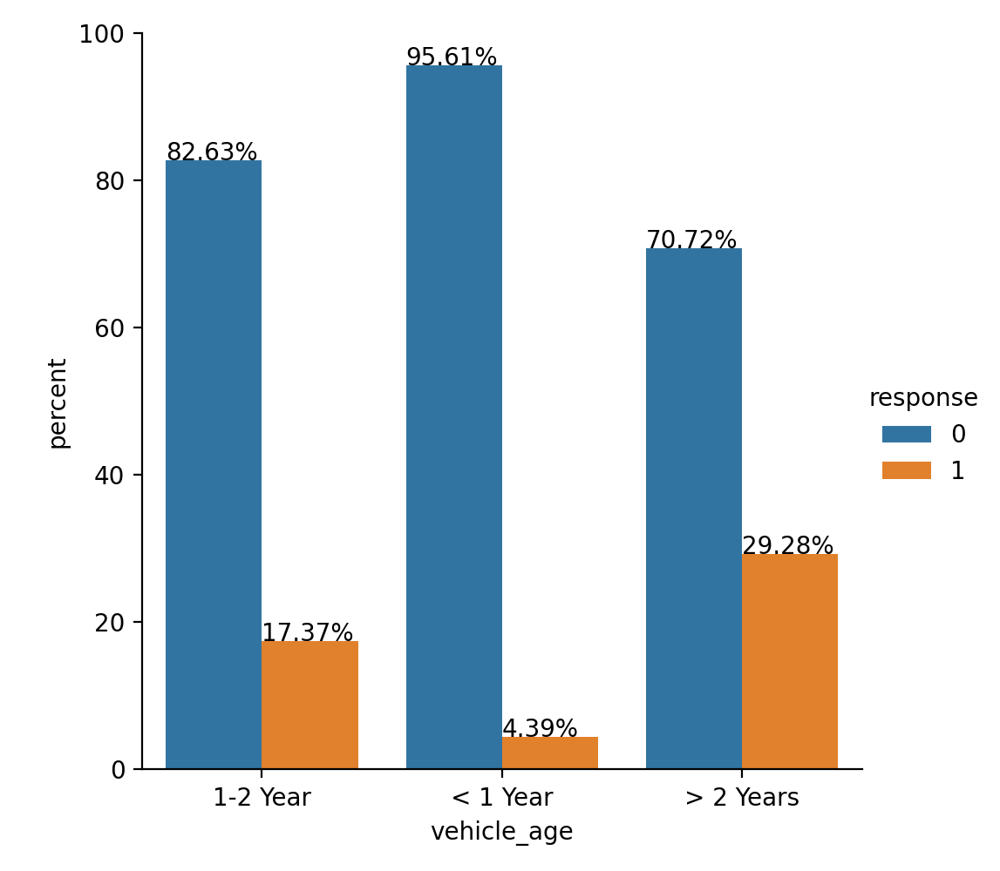

In [38]:
dfgraph = df2.groupby('vehicle_age')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='vehicle_age',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 3.** Clientes que tiveram o carro danificado no passado são mais propensos a comprar um seguro.


**Verdadeiro:** 97.9% das pessoas que aceitram o seguro o carro já havia sido danificado anteriormente. 

In [39]:
df2[['vehicle_damage','response', 'id']].groupby(['vehicle_damage','response']).count()

id
vehicle_damage response        
No             0         150134
               1            794
Yes            0         117385
               1          36574

In [40]:
fig = px.pie(df2, values='response', names='vehicle_damage')
fig.show()

**Hipótese 4.** Clientes que já possuiam um seguro veicular ativo são menos propensos a adquirir um seguro veicular.


**VERDADEIRO:** Apenas 0.08% dos clientes que possuiam um seguro veicular anterior se interessou pelo novo seguro oferecido

In [41]:
df2[['previously_insured','response', 'id']].groupby(['previously_insured','response']).count()

id
previously_insured response        
0                  0         127960
                   1          37250
1                  0         139559
                   1            118

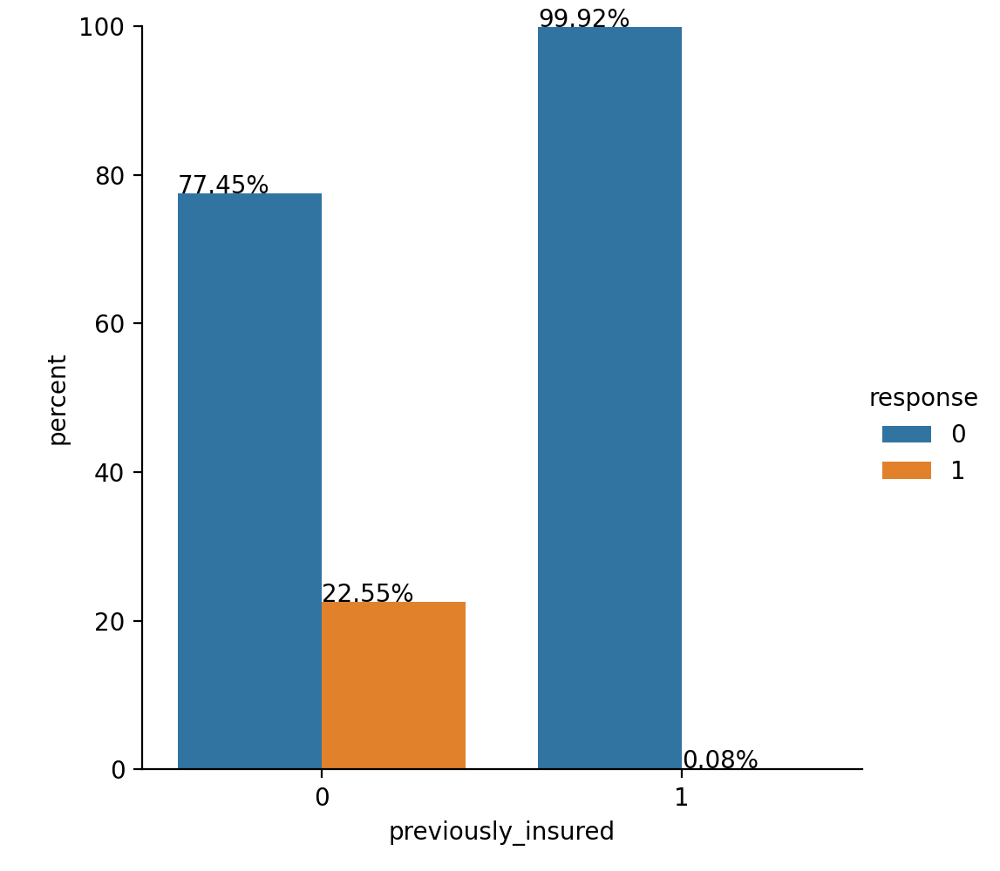

In [42]:
dfgraph = df2.groupby('previously_insured')['response'].value_counts(normalize=True)
dfgraph = dfgraph.mul(100)
dfgraph = dfgraph.rename('percent').reset_index()

g = sns.catplot(x='previously_insured',y='percent',hue='response',kind='bar',data=dfgraph)
g.ax.set_ylim(0,100)

for p in g.ax.patches:
    txt = str(p.get_height().round(2)) + '%'
    txt_x = p.get_x() 
    txt_y = p.get_height()
    g.ax.text(txt_x,txt_y,txt)

**Hipótese 5.** Pessoas que possuem um maior tempo como cliente, são mais propensos a adquirir um seguro veicular.


**FALSO:** Não a quaisquer relação observável entre o tempo como cliente e a proporção entre estar interessada no seguro ou não

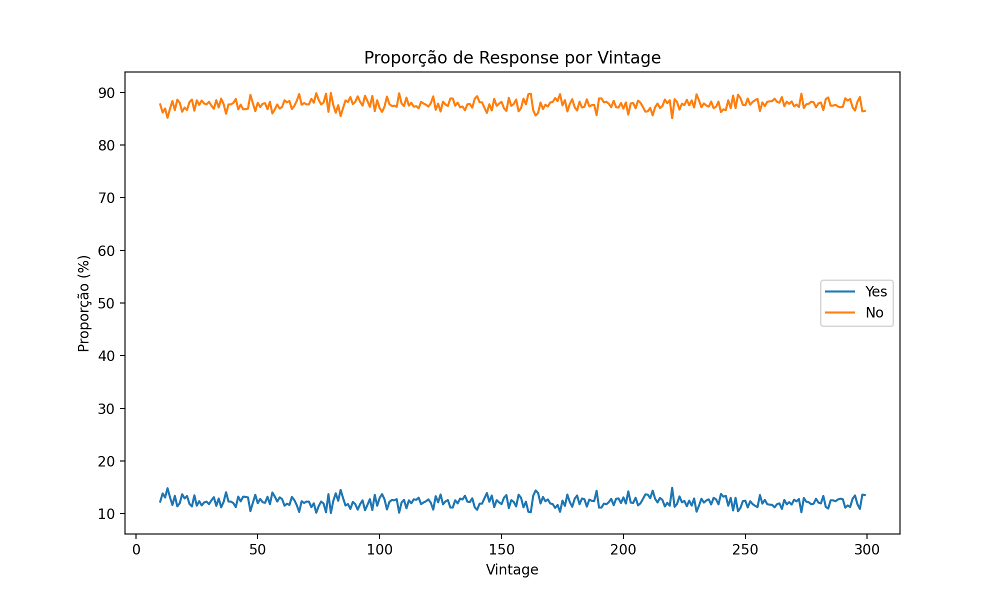

In [43]:
df_modified = df2.copy()
df_modified['response'] = df_modified['response'].replace({1: 'Yes', 0: 'No'})
proporcao_response = df_modified.groupby('vintage')['response'].value_counts(normalize=True).mul(100).unstack()
plt.figure(figsize=(10, 6))
plt.plot(proporcao_response.index, proporcao_response['Yes'], label='Yes')
plt.plot(proporcao_response.index, proporcao_response['No'], label='No')
plt.xlabel('Vintage')
plt.ylabel('Proporção (%)')
plt.title('Proporção de Response por Vintage')
plt.legend()
plt.show()


**Hipótese 6.** Clientes não habilitados não adquirem seguros veiculares.


**FALSO:** 34 clientes sem carta adquiriram o seguro. O que representa 0,091% das pessoas que adquiriram seguro. É um número extremamente baixo, portanto podemos dizer que a grande maioria dos interessados em seguro são habilitados.

In [44]:
df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index()

,level_0,driving_license,0
0,id,0,34
1,id,1,37334


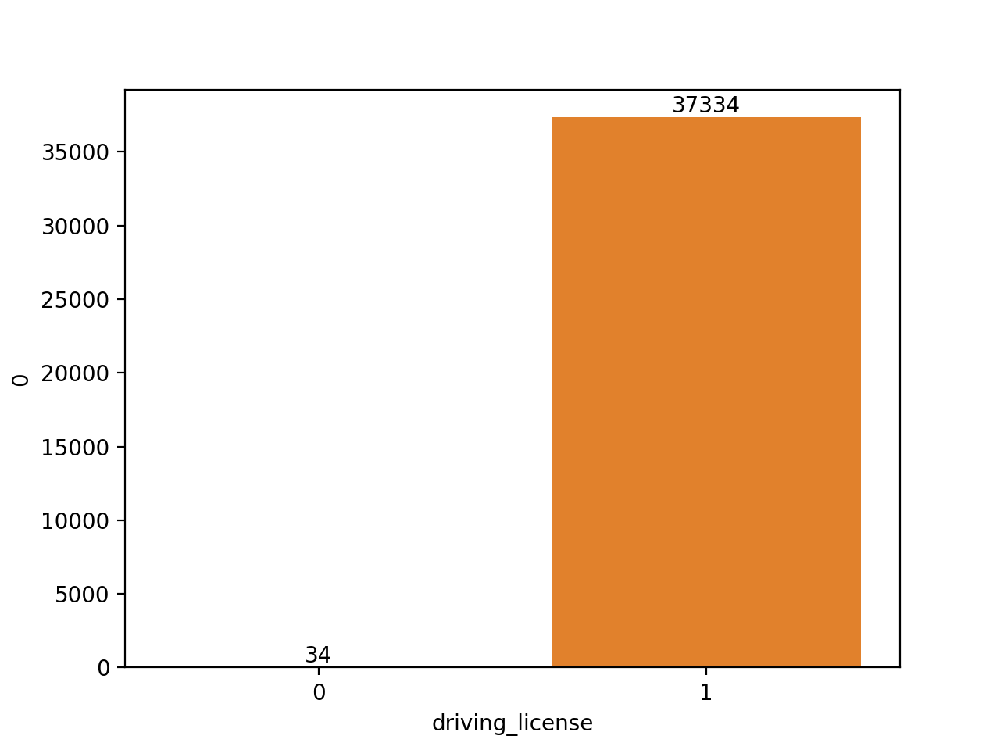

In [45]:
ax = sns.barplot(df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index(), x='driving_license', y=0)
for i in ax.containers:
    ax.bar_label(i,)

In [46]:
px.pie(df2[['driving_license', 'id']][df2['response']==1].groupby(['driving_license']).count().unstack().reset_index(), values=0, names='driving_license')

### 5.3 Análise Multivariada

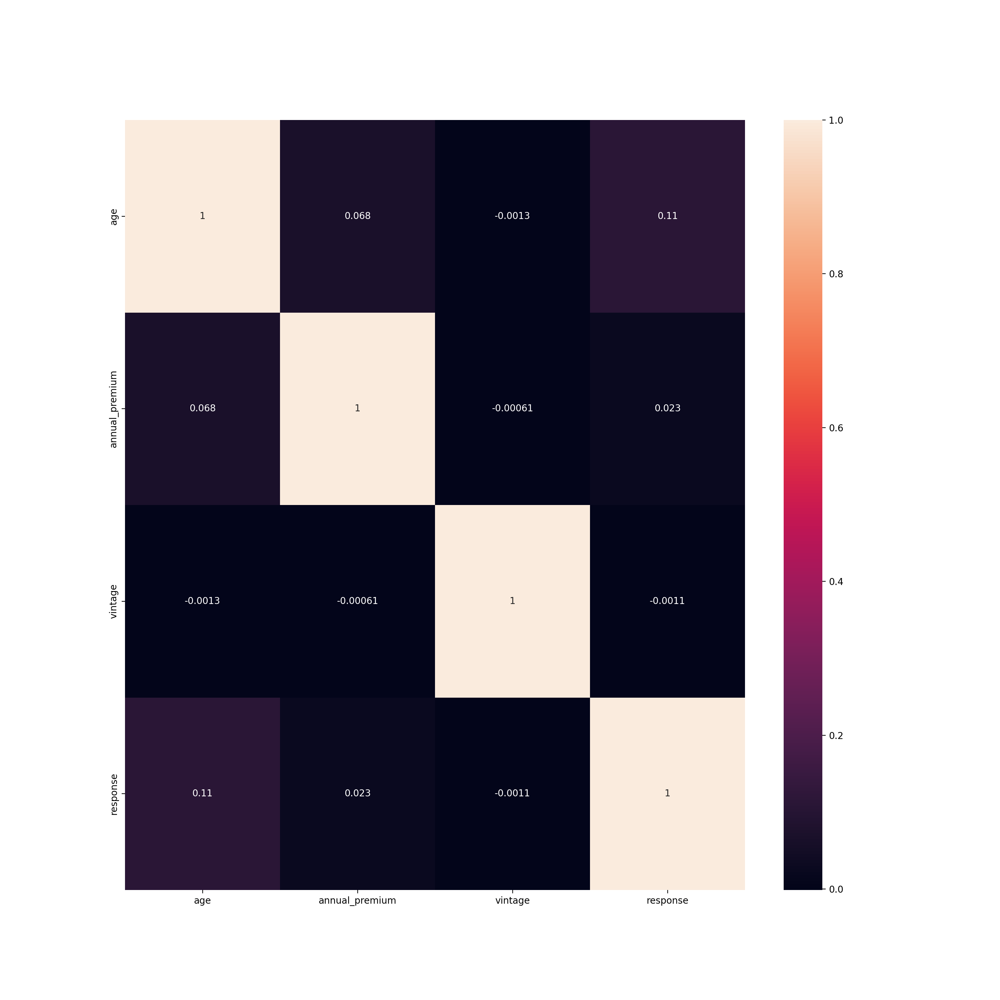

In [47]:
fig = plt.figure(figsize=[15,15])
fig = sns.heatmap(df_num.corr( method='pearson'), annot=True)

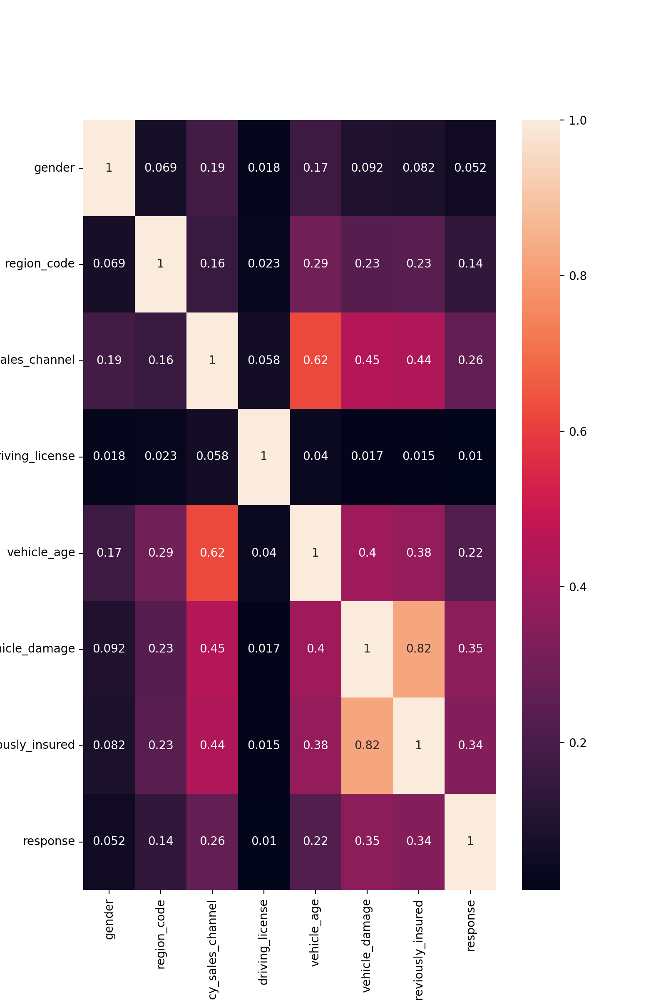

In [48]:
df_cat = df_cat.astype("category")

cramersv = am.CramersV(df_cat) 
df_heat=cramersv.fit()

f = plt.figure(figsize=(8,12))
f= sns.heatmap( df_heat, annot=True );

In [49]:
#Salvando dados
df2.to_csv('data/df_eda_done.csv')

## 6.0 Preparação dos Dados

In [131]:
df3 = pd.read_csv('data/df_eda_done.csv',index_col=0)

### 6.1 Criação de Features

##### Para esse projeto não iremos criar nenhuma nova Feature

### 6.2 Standardization

A coluna annual_premium quando filtrada apresenta uma distribuicao proxima da normal, neste primeiro ciclo utilizaremos a tecnica de Standardization sem tratar os outliers para ver qual será o resultado. Em um próximo ciclo, podemos tratar os outliers utilizando tecnicas de substituicao ou remocao. Porem afim de minimizar o efeito dos outliers utilizaremos o RobustScaler

In [132]:
#annual_premium
annual_premium_scaler = pp.RobustScaler()
df3['annual_premium'] = annual_premium_scaler.fit_transform( df3[['annual_premium']].values )
pickle.dump (robust_scaler, open ('pkl/annual_premium_scaler.pkl', 'wb') )

### 6.3 Rescaling

In [133]:
#age
age_scaler = pp.MinMaxScaler()
df3['age'] = age_scaler.fit_transform( df3[['age']].values )
pickle.dump (age_scaler, open ('pkl/age_scaler.pkl', 'wb') )

#vintage
vintage_scaler = pp.MinMaxScaler()
df3['vintage'] = vintage_scaler.fit_transform( df3[['vintage']].values )
pickle.dump (vintage_scaler, open ('pkl/vintage_scaler.pkl', 'wb') )

### 6.4 Encoding

In [134]:
#previously_insured - Não é necessário
#driving_license - Não é necessário

#gender - one hot encoding
df3 = pd.get_dummies(df3,prefix='gender',columns=['gender'])

#region_code - target encoder
region_code_encoder= ce.TargetEncoder(cols='region_code') 
df3['region_code'] = region_code_encoder.fit_transform(df3['region_code'],df3['response'])
pickle.dump (region_encoder, open ('pkl/region_code_encoder.pkl', 'wb') )
                      
#vehicle_age - Ordinal encoder
mapping = {"< 1 Year": 1,  "1-2 Year": 2, "> 2 Years": 3}
df3['vehicle_age'] = df3['vehicle_age'].map(mapping)

#vehicle_damage - Label Encoder
vehicle_damage_encoder = pp.LabelEncoder()
df3['vehicle_damage'] = vehicle_damage_encoder.fit_transform( df3['vehicle_damage'].values)
pickle.dump (vd_le, open ('pkl/vehicle_damage_encoder.pkl', 'wb') )

#policy_sales_channel - Target encoder
sales_channel_encoder= ce.TargetEncoder(cols='policy_sales_channel') 
df3['policy_sales_channel'] = sales_channel_encoder.fit_transform(df3['policy_sales_channel'],df3['response'])
pickle.dump (sales_channel_encoder, open ('pkl/sales_channel_encoder.pkl', 'wb') )

In [54]:
df3.isna().sum()

id                      0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
gender_Female           0
gender_Male             0
dtype: int64

In [55]:
#Salvando dados
df3.to_csv('data/df_data_prep_done.csv')

### 6.5 Preparacao dados de teste

In [56]:
df_teste = pd.read_csv('data/df_test_split.csv',index_col=0)

In [57]:
df_teste

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response
16221,16222,Male,54,1,28,0,> 2 Years,Yes,75219.0,26,53,1
342480,342481,Female,26,1,3,0,1-2 Year,Yes,19738.0,156,280,0
20915,20916,Male,25,1,28,0,< 1 Year,Yes,61524.0,124,255,0
38703,38704,Male,29,1,24,0,1-2 Year,Yes,2630.0,157,235,1
363808,363809,Female,28,1,28,0,< 1 Year,Yes,51473.0,26,243,1
...,...,...,...,...,...,...,...,...,...,...,...,...
151614,151615,Male,40,1,28,0,1-2 Year,Yes,32747.0,124,140,0
170170,170171,Female,39,1,48,0,1-2 Year,No,2630.0,124,178,0
303221,303222,Male,60,1,28,0,1-2 Year,Yes,36965.0,26,285,0
333829,333830,Male,23,1,15,1,< 1 Year,No,28270.0,152,98,0


In [58]:
#annual_premium
df_teste['annual_premium'] = robust_scaler.transform( df_teste[['annual_premium']].values )

#age
df_teste['age'] = age_scaler.transform( df_teste[['age']].values )

#vintage
df_teste['vintage'] = vintage_scaler.transform( df_teste[['vintage']].values )

#gender - one hot encoding
df_teste = pd.get_dummies(df_teste,prefix='gender',columns=['gender'])

#region_code - target encoder
df_teste['region_code'] = region_encoder.transform(df_teste['region_code'])
                      
#vehicle_age - Ordinal encoder
df_teste['vehicle_age'] = df_teste['vehicle_age'].map(mapping)

#vehicle_damage - Label Encoder
df_teste['vehicle_damage'] = vd_le.transform( df_teste['vehicle_damage'].values)

#policy_sales_channel - Target encoder
df_teste['policy_sales_channel'] = sales_channel_encoder.transform(df_teste['policy_sales_channel'])

In [59]:
df_teste.isna().sum()

id                      0
age                     0
driving_license         0
region_code             0
previously_insured      0
vehicle_age             0
vehicle_damage          0
annual_premium          0
policy_sales_channel    0
vintage                 0
response                0
gender_Female           0
gender_Male             0
dtype: int64

In [60]:
#Salvando dados
df_teste.to_csv('data/df_test_data_prep_done.csv')

## 6.0 Seleção de Features

In [61]:
#Utilizaremos uma Random Forest para selecionar as features
model_fs = RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state=42 )

x_train_fs = df3.drop(['id', 'response'], axis=1)
y_train_fs = df3['response'].values

model_fs.fit(x_train_fs, y_train_fs)

RandomForestClassifier(n_estimators=250, n_jobs=-1, random_state=42)

<AxesSubplot: >

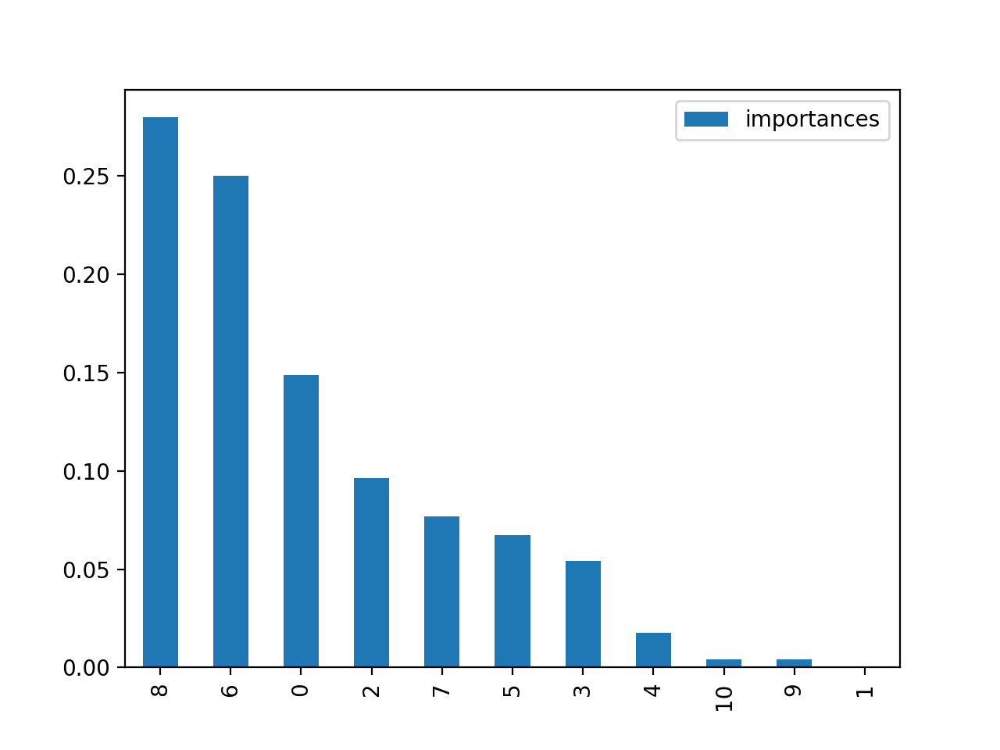

In [62]:
importances = model_fs.feature_importances_

df_fs = pd.DataFrame({'features':pd.DataFrame(x_train_fs).columns, 'importances': importances})
df_fs.set_index('importances')

df_fs = df_fs.sort_values('importances',ascending=False)


df_fs.plot.bar()

In [63]:
df_fs

,features,importances
8,vintage,0.279792
6,annual_premium,0.250074
0,age,0.148972
2,region_code,0.096405
7,policy_sales_channel,0.076840
5,vehicle_damage,0.067335
3,previously_insured,0.054056
4,vehicle_age,0.017511
10,gender_Male,0.004223
9,gender_Female,0.004222


In [64]:
fs_cols = ['vintage', 'annual_premium', 'age', 'region_code',
           'policy_sales_channel', 'vehicle_damage', 'previously_insured','response']

In [65]:
df3 = df3[fs_cols]

In [66]:
df3

,vintage,annual_premium,age,region_code,policy_sales_channel,vehicle_damage,previously_insured,response
274710,0.667820,-0.415027,0.030769,0.117421,0.028815,1,0,0
216539,0.121107,0.445213,0.092308,0.095217,0.199689,0,1,0
78983,0.086505,0.027992,0.184615,0.187042,0.173815,1,0,1
218368,0.709343,0.399867,0.184615,0.077466,0.028815,1,0,0
307215,0.733564,1.130918,0.061538,0.187042,0.212110,1,0,0
...,...,...,...,...,...,...,...,...
378816,0.166090,-0.577593,0.076923,0.084509,0.021905,1,1,0
67726,0.968858,-0.004455,0.753846,0.187042,0.199689,1,0,1
91744,0.179931,1.821609,0.061538,0.187042,0.028815,0,0,0
48700,0.871972,-0.183311,0.307692,0.095217,0.199689,0,1,0


In [67]:
#Salvando dados
df3.to_csv('data/df3_feat_select__done.csv')

## 7.0 Modelos Machine Learning

### 7.1 Train-Validation Split

In [68]:
df4 = pd.read_csv('data/df3_feat_select__done.csv',index_col=0)

In [69]:
X = df4.drop('response', axis = 1).copy()
y = df4['response'].copy()

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=0.1, random_state=42, stratify = y)

In [70]:
#verificar y_train
y_train.value_counts() / y_train.count() 

0    0.877437
1    0.122563
Name: response, dtype: float64

In [71]:
#verificar y_val
y_val.value_counts() / y_val.count()

0    0.877431
1    0.122569
Name: response, dtype: float64

### 7.2 Modelos de Machine Learning

#### 7.2.1 Modelos - Teste único

##### KNN

In [72]:
model_knn = KNeighborsClassifier()
model_knn.fit(X_train, y_train)
yhat_proba_knn = model_knn.predict_proba( X_val )

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

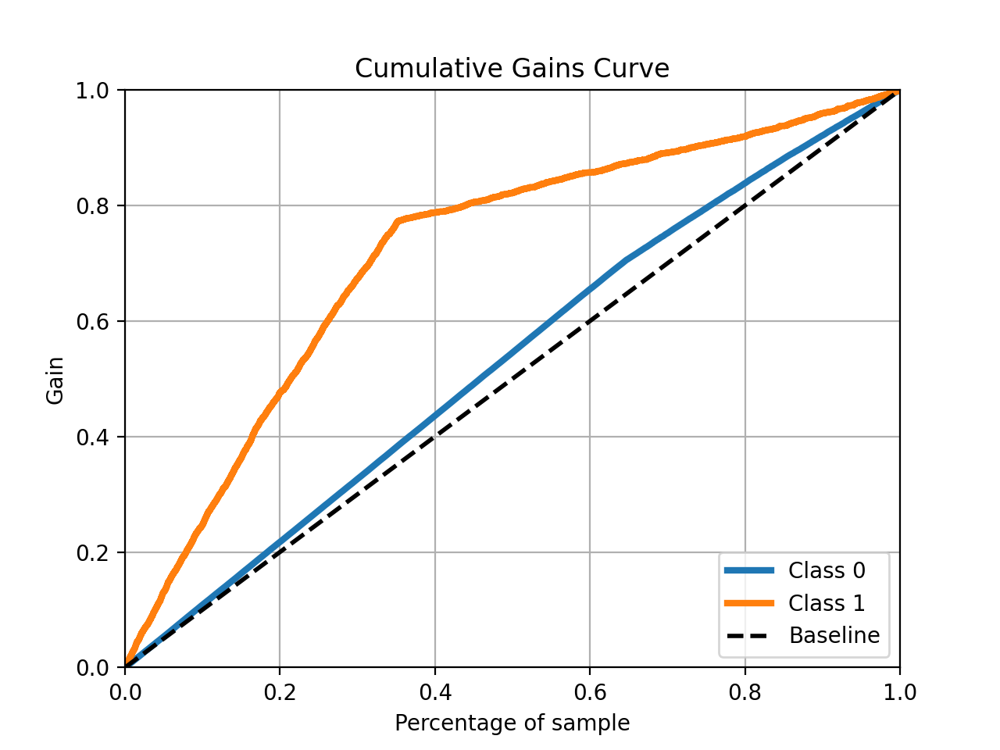

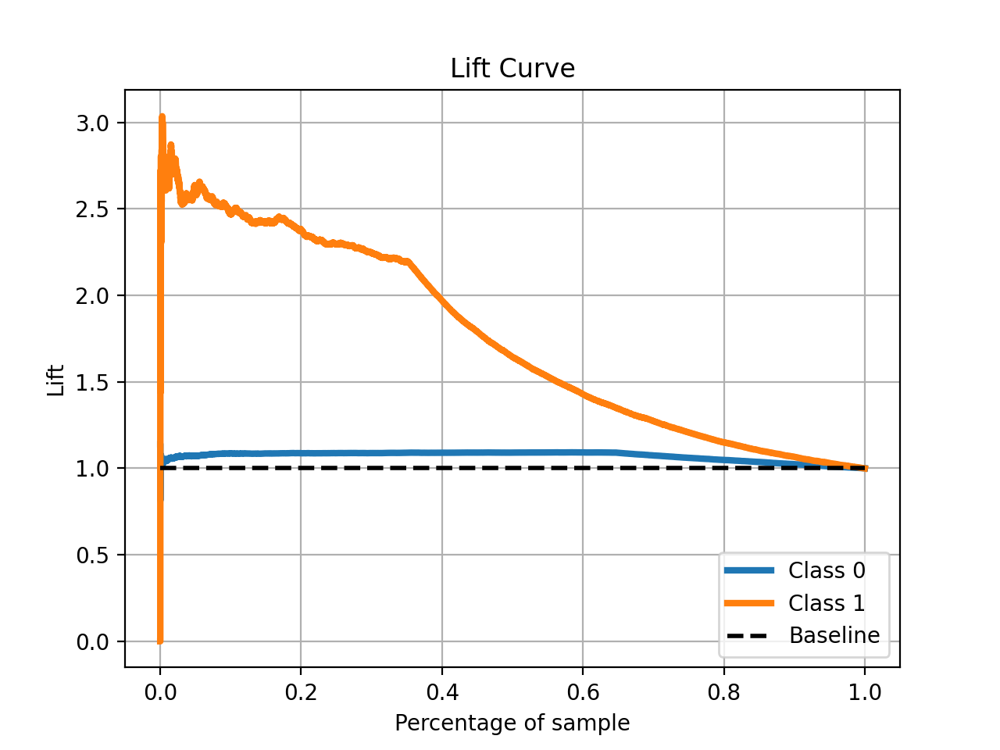

In [73]:
skplt.metrics.plot_cumulative_gain( y_val, yhat_proba_knn )
skplt.metrics.plot_lift_curve( y_val, yhat_proba_knn )


##### Logistic Regression

In [74]:
model_lr = LogisticRegression()
model_lr.fit(X_train, y_train)
yhat_proba_lr = model_lr.predict_proba( X_val )

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

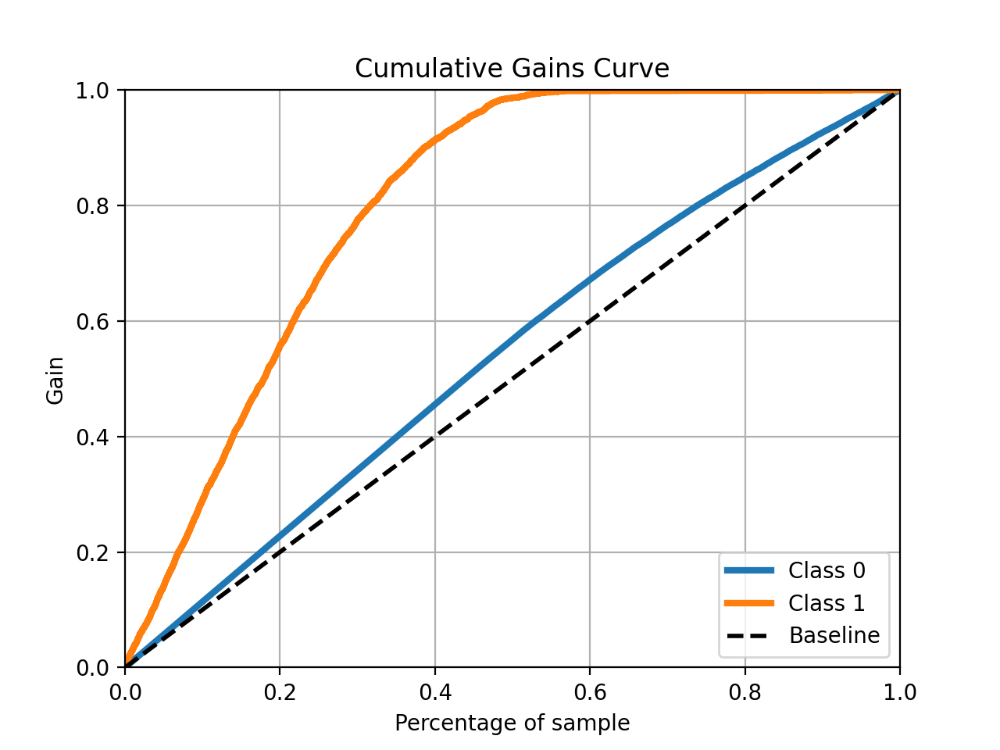

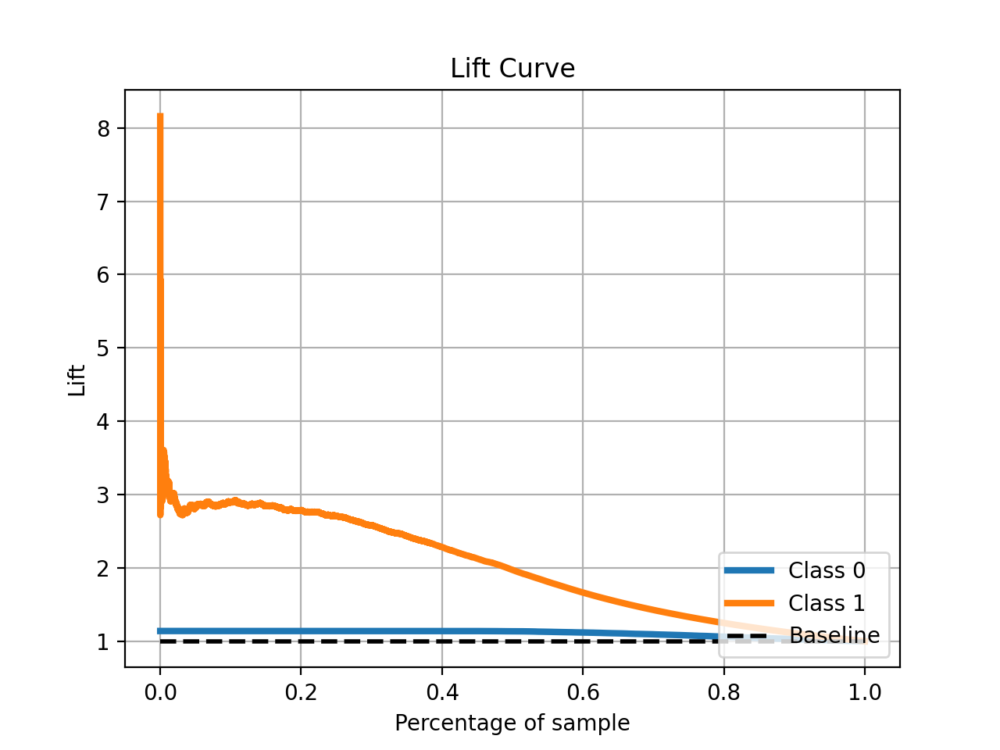

In [75]:
skplt.metrics.plot_cumulative_gain( y_val, yhat_proba_lr )
skplt.metrics.plot_lift_curve( y_val, yhat_proba_lr )

##### XGBoost

In [76]:
model_xgb = XGBClassifier()

model_xgb.fit(X_train, y_train)

yhat_proba_xgb = model_xgb.predict_proba( X_val )

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

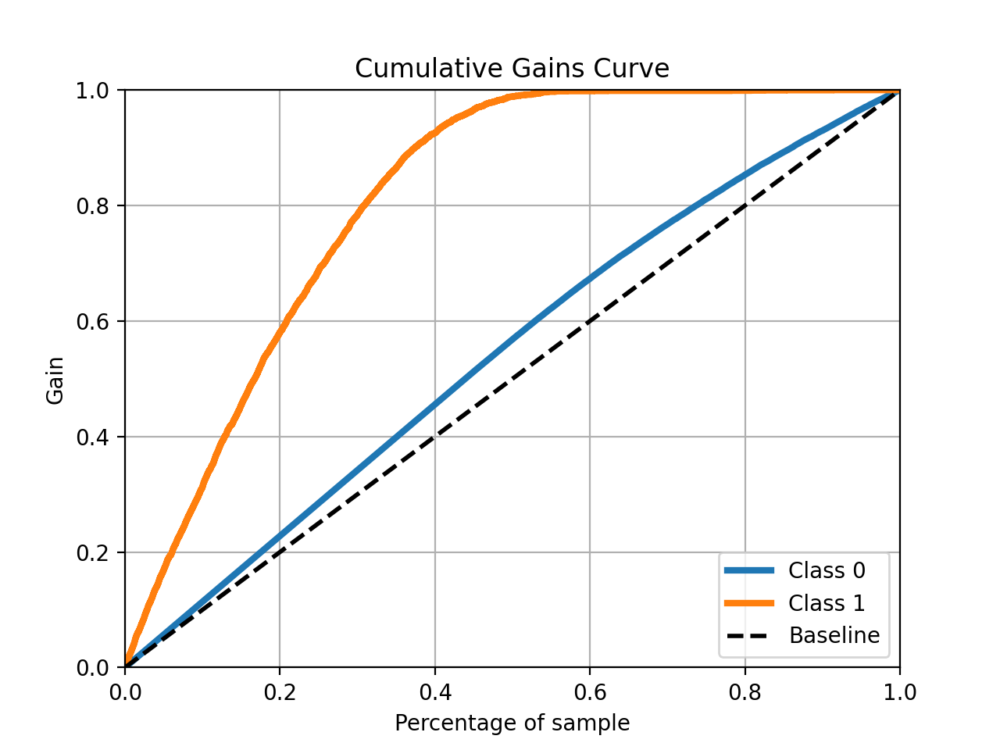

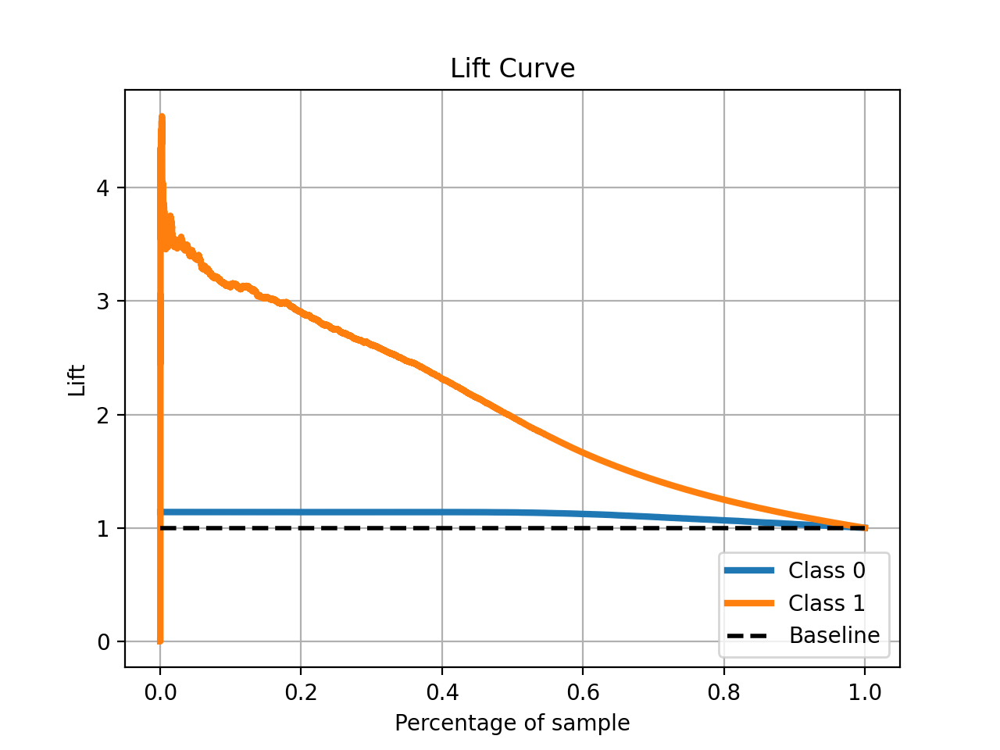

In [77]:
skplt.metrics.plot_cumulative_gain( y_val, yhat_proba_xgb )
skplt.metrics.plot_lift_curve( y_val, yhat_proba_xgb )

##### Naive Bayes

In [78]:
model_nb = GaussianNB()
model_nb.fit(X_train, y_train)
yhat_proba_nb = model_nb.predict_proba( X_val )

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

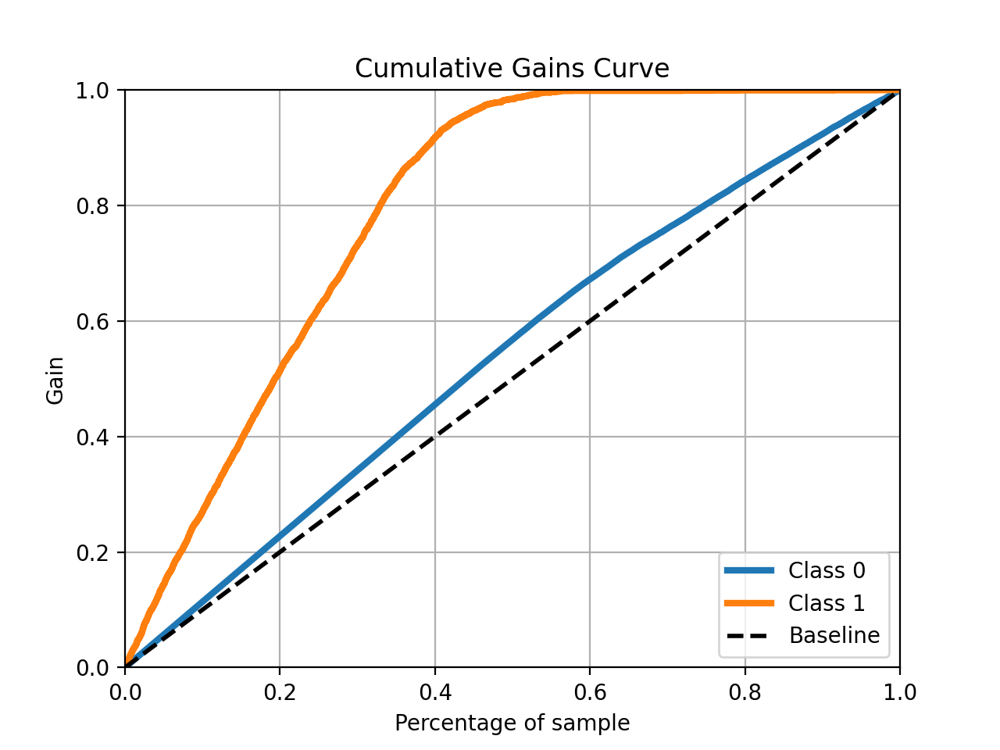

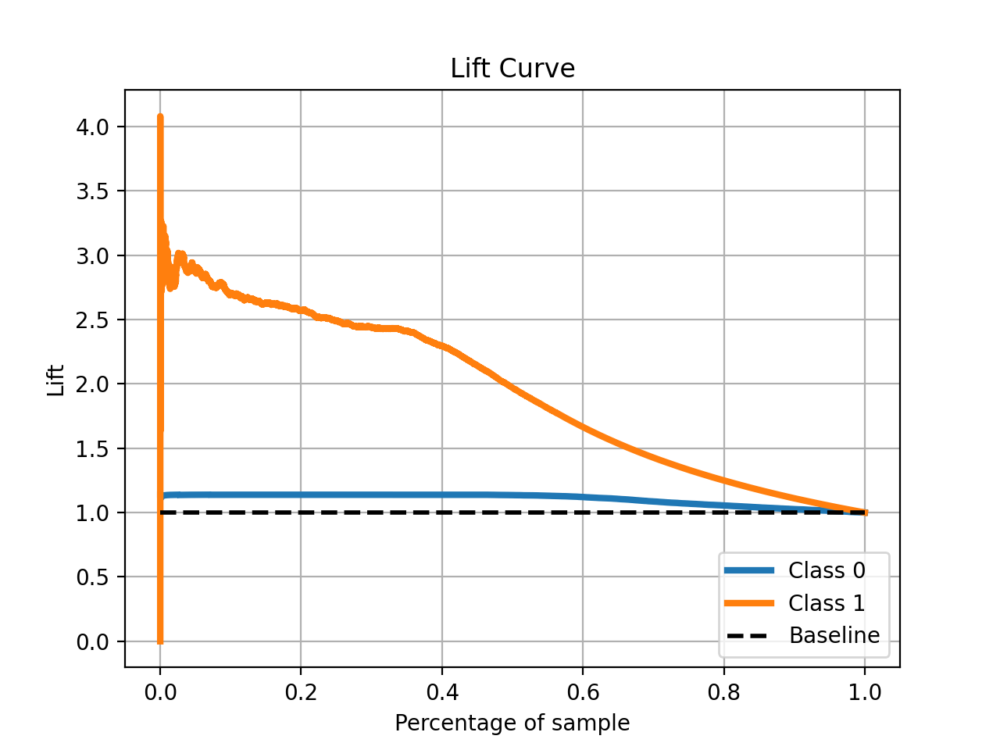

In [79]:
skplt.metrics.plot_cumulative_gain( y_val, yhat_proba_nb )
skplt.metrics.plot_lift_curve( y_val, yhat_proba_nb )

##### Random Forest

In [80]:
model_rf = RandomForestClassifier(max_depth=5, random_state=0)
model_rf.fit(X_train, y_train)
yhat_proba_rf = model_rf.predict_proba( X_val )

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

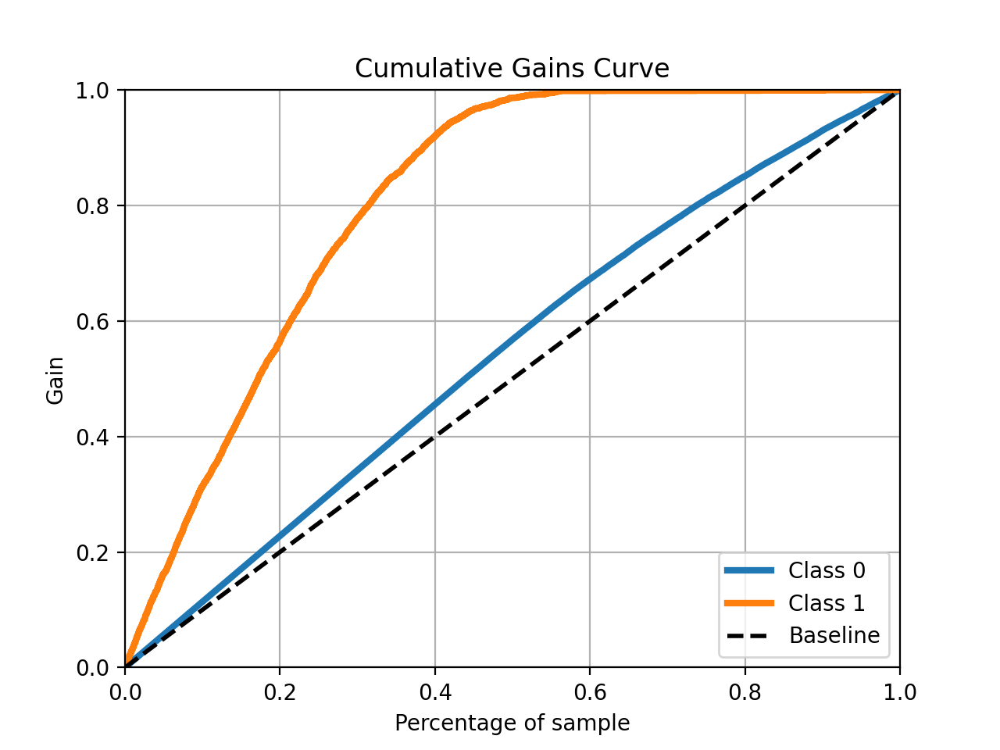

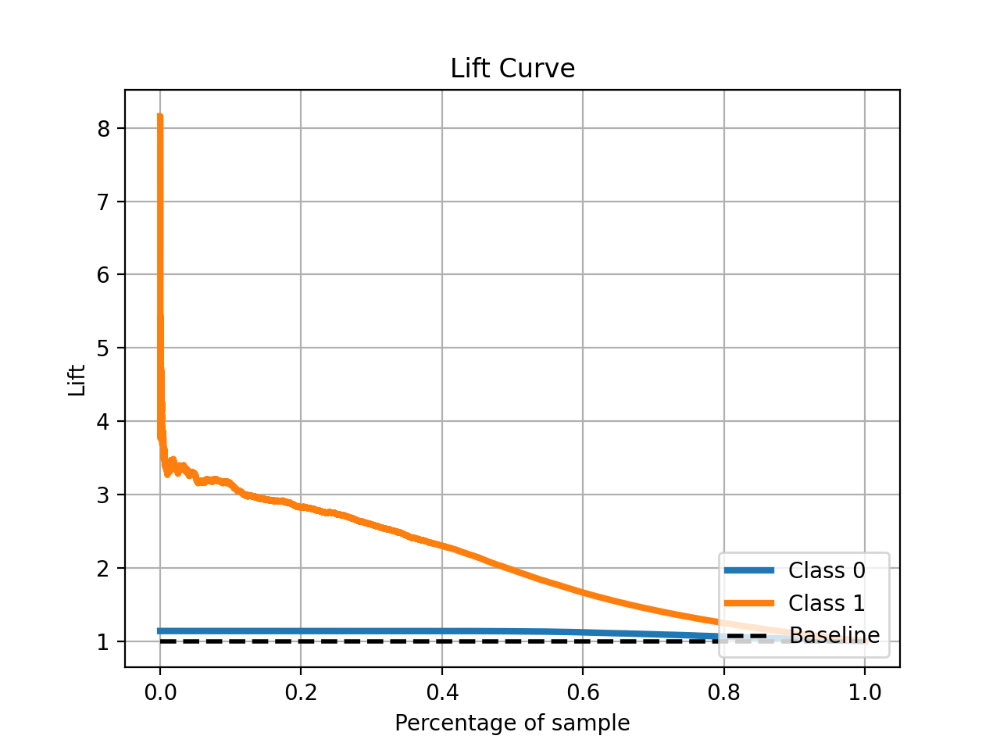

In [81]:
skplt.metrics.plot_cumulative_gain( y_val, yhat_proba_rf )
skplt.metrics.plot_lift_curve( y_val, yhat_proba_rf )

#### 7.2.2 Performance dos modelos - Teste único

In [82]:
#DF_Performance
df_perf = X_val.copy()
df_perf['response'] = y_val.copy()
df_perf['score_knn'] = yhat_proba_knn[:,1].tolist()
df_perf['score_lr'] = yhat_proba_lr[:,1].tolist()
df_perf['score_xgb'] = yhat_proba_xgb[:,1].tolist()
df_perf['score_nb'] = yhat_proba_nb[:,1].tolist()
df_perf['score_rf'] = yhat_proba_rf[:,1].tolist()

Iremos usar como parâmetro os 30% da base de validação. Que é aproximadamente a posição 9147 do ranking

In [83]:
knn = precision_recall_at_k(df_perf,k=9147, proba='score_knn', model = 'KNN')
lr  = precision_recall_at_k(df_perf,k=9147, proba='score_lr',  model = 'Logistic Regression')
xgb = precision_recall_at_k(df_perf,k=9147, proba='score_xgb',  model = 'XGBoost')
nb = precision_recall_at_k(df_perf,k=9147, proba='score_nb',  model = 'Naive Bayes')
rf = precision_recall_at_k(df_perf,k=9147, proba='score_rf',  model = 'Random Forest')
single_metrics = pd.concat([knn,lr,xgb,nb,rf])
single_metrics

,model,ranking,precision_at_k,recall_at_k
9146,KNN,9147,0.274735,0.672465
9146,Logistic Regression,9147,0.316497,0.774686
9146,XGBoost,9147,0.320214,0.783784
9146,Naive Bayes,9147,0.298896,0.731603
9146,Random Forest,9147,0.317809,0.777897


###### A principio os 3 melhores modelos para a solução do nosso problema de rankeamento são Logistc Regression, XGBoost e Random Forest, porém antes de leva-los para a etapa de hyper parameter fine tunning iremos aplicar o cross validation em todos os modelos.

#### 7.2.3 Modelos e Performance - Cross Validation

In [84]:
cv_knn = cross_validation(model_knn, X, y)

In [85]:
cv_knn = cv_knn.transpose()
cv_knn['model'] = 'KNN'
cv_knn

,precision_at_k,recall_at_k,model
mean,0.276285,0.676162,KNN
std,0.006091,0.007756,KNN


In [86]:
cv_lr = cross_validation(model_lr, X, y)

In [87]:
cv_lr = cv_lr.transpose()
cv_lr['model'] = 'Logistic Regression'
cv_lr

,precision_at_k,recall_at_k,model
mean,0.313634,0.767649,Logistic Regression
std,0.004676,0.006661,Logistic Regression


In [88]:
cv_xgb = cross_validation(model_xgb, X, y)

In [89]:
cv_xgb = cv_xgb.transpose()
cv_xgb['model'] = 'XGBoost'
cv_xgb

,precision_at_k,recall_at_k,model
mean,0.318555,0.779680,XGBoost
std,0.004721,0.005182,XGBoost


In [90]:
cv_nb = cross_validation(model_nb, X, y)

In [91]:
cv_nb = cv_nb.transpose()
cv_nb['model'] = 'Naive Bayes'
cv_nb

,precision_at_k,recall_at_k,model
mean,0.297944,0.729221,Naive Bayes
std,0.004624,0.003670,Naive Bayes


In [92]:
cv_rf = cross_validation(model_rf, X, y)

In [93]:
cv_rf = cv_rf.transpose()
cv_rf['model'] = 'Random Forest'
cv_rf

,precision_at_k,recall_at_k,model
mean,0.316816,0.775416,Random Forest
std,0.005189,0.006478,Random Forest


In [94]:
cv_metrics = pd.concat([cv_knn,cv_lr,cv_xgb,cv_nb,cv_rf])
cv_metrics

,precision_at_k,recall_at_k,model
mean,0.276285,0.676162,KNN
std,0.006091,0.007756,KNN
mean,0.313634,0.767649,Logistic Regression
std,0.004676,0.006661,Logistic Regression
mean,0.318555,0.779680,XGBoost
std,0.004721,0.005182,XGBoost
mean,0.297944,0.729221,Naive Bayes
std,0.004624,0.003670,Naive Bayes
mean,0.316816,0.775416,Random Forest
std,0.005189,0.006478,Random Forest


###### Iremos seguir para a etapa de  hyper parameter fine tunning com os modelos Logistc Regression, Random Forest e o XGBoost devido ao maior Recall dentro dos primeiros 30% da nossa base de dados rankeada.

### 7.3  Hyper Parameter Fine Tunning

In [95]:
parameters = {'n_estimators':  [100, 300, 500],
              'max_depth': [3,5,9], 
              'scale_pos_weight': [1, 9]}

max_eval = 5

for i in range(max_eval):
    hp = {k: random.sample(v,1)[0] for k, v in parameters.items()}
    print(hp)

    # model
    model_xgb_hp = XGBClassifier(n_estimators = hp['n_estimators'],
                                        max_depth = hp['max_depth'],
                                        scale_pos_weight = hp['scale_pos_weight'],
                                        n_jobs= -1)
    
    
    display(cross_validation(model_xgb_hp, X, y))

{'n_estimators': 100, 'max_depth': 5, 'scale_pos_weight': 1}


,mean,std
precision_at_k,0.319899,0.004611
recall_at_k,0.782975,0.005044


{'n_estimators': 100, 'max_depth': 9, 'scale_pos_weight': 1}


,mean,std
precision_at_k,0.314017,0.005395
recall_at_k,0.768549,0.005669


{'n_estimators': 500, 'max_depth': 3, 'scale_pos_weight': 9}


,mean,std
precision_at_k,0.317844,0.005680
recall_at_k,0.777915,0.006904


{'n_estimators': 300, 'max_depth': 5, 'scale_pos_weight': 9}


,mean,std
precision_at_k,0.314214,0.005033
recall_at_k,0.769045,0.005617


{'n_estimators': 300, 'max_depth': 5, 'scale_pos_weight': 1}


,mean,std
precision_at_k,0.317199,0.004478
recall_at_k,0.776376,0.006075


In [96]:
parameters = {
    'penalty':  ['l1', 'l2'],
    'C':  [0.5, 1, 10, 100],
    'solver': ['liblinear', 'saga'],
    'class_weight': [None, 'balanced']
}

max_eval = 5

for i in range(max_eval):
    # random choice of dictionary values
    hp = {k: random.sample(v,1)[0] for k, v in parameters.items()}
    print(hp)

    # model definition
    model_lr_hp = LogisticRegression(penalty = hp['penalty'],
                                  C = hp['C'], 
                                  solver = hp['solver'],
                                  class_weight = hp['class_weight'],
                                  max_iter = 1000,
                                  n_jobs= -1)
    display(cross_validation(model_lr_hp, X, y))

{'penalty': 'l2', 'C': 10, 'solver': 'liblinear', 'class_weight': 'balanced'}


C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does no

,mean,std
precision_at_k,0.314389,0.004729
recall_at_k,0.769491,0.006410


{'penalty': 'l2', 'C': 1, 'solver': 'saga', 'class_weight': None}


,mean,std
precision_at_k,0.313667,0.004667
recall_at_k,0.767730,0.006701


{'penalty': 'l2', 'C': 1, 'solver': 'liblinear', 'class_weight': 'balanced'}


C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does no

,mean,std
precision_at_k,0.314400,0.004701
recall_at_k,0.769518,0.006291


{'penalty': 'l1', 'C': 100, 'solver': 'liblinear', 'class_weight': 'balanced'}


C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 12.

C:\Users\Rafael\anaconda3\envs\propensao_compra\lib\site-packages\sklearn\linear_model\_logistic.py:1211: UserWarning:

'n_jobs' > 1 does no

,mean,std
precision_at_k,0.314389,0.004729
recall_at_k,0.769491,0.006410


{'penalty': 'l2', 'C': 1, 'solver': 'saga', 'class_weight': 'balanced'}


,mean,std
precision_at_k,0.314400,0.004701
recall_at_k,0.769518,0.006291


In [97]:
parameters = {'n_estimators':  [100, 300, 500],
              'max_depth': [3,5,9], 
               'min_samples_leaf': [1, 2, 4],
               'min_samples_split': [2, 5, 10]}

max_eval = 5

for i in range(max_eval):
    hp = {k: random.sample(v,1)[0] for k, v in parameters.items()}
    print(hp)

    # model
    model_rf_hp = RandomForestClassifier(n_estimators = hp['n_estimators'],
                                        max_depth = hp['max_depth'],
                                        min_samples_leaf =  hp['min_samples_leaf'],
                                        min_samples_split = hp['min_samples_split'],
                                        n_jobs= -1)
    
    display(cross_validation(model_rf_hp, X, y))

{'n_estimators': 500, 'max_depth': 5, 'min_samples_leaf': 1, 'min_samples_split': 5}


,mean,std
precision_at_k,0.317057,0.005209
recall_at_k,0.776000,0.005921


{'n_estimators': 500, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 2}


,mean,std
precision_at_k,0.317057,0.005098
recall_at_k,0.776002,0.005602


{'n_estimators': 500, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 5}


,mean,std
precision_at_k,0.317330,0.005324
recall_at_k,0.776666,0.006203


{'n_estimators': 500, 'max_depth': 9, 'min_samples_leaf': 2, 'min_samples_split': 10}


,mean,std
precision_at_k,0.319768,0.005591
recall_at_k,0.782629,0.006679


{'n_estimators': 100, 'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10}


,mean,std
precision_at_k,0.316783,0.005105
recall_at_k,0.775339,0.006496


###### Após o Hyperparameter Fine Tuning, o modelo com melhor performance no geral foi o XGBoost com um recall at k (9146 - 30%) de  0.783711 na média durante o cross validation. Portanto seguiremos com esse modelo e com os seguintes parametros: 'n_estimators': 100, 'max_depth': 3, 'scale_pos_weight': 9

### 7.4  Teste do Modelo Escolhido

In [98]:
# modelo
model_xgb_final = XGBClassifier(n_estimators = 100,
                                    max_depth = 3,
                                    scale_pos_weight = 9,
                                    n_jobs= -1)

# Treino do modelo final com dados de validação e treino juntos
model_xgb_final.fit(X, y)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [99]:
#Carregando dados de teste preparados e selecionando variáveis.
df_teste = pd.read_csv('data/df_test_data_prep_done.csv',index_col=0)
x_teste = df_teste[['vintage', 'annual_premium', 'age', 'region_code',
           'policy_sales_channel', 'vehicle_damage', 'previously_insured']].copy()
y_teste = df_teste['response']

In [100]:
yhat_proba_xgb_final = model_xgb_final.predict_proba(x_teste)

<AxesSubplot: title={'center': 'Lift Curve'}, xlabel='Percentage of sample', ylabel='Lift'>

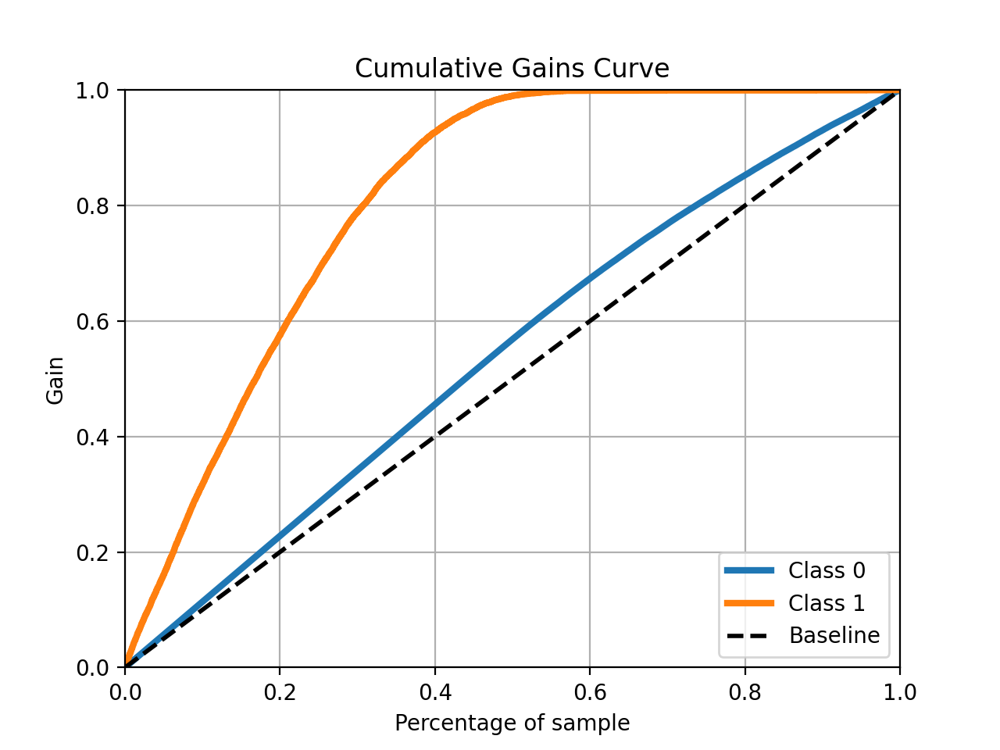

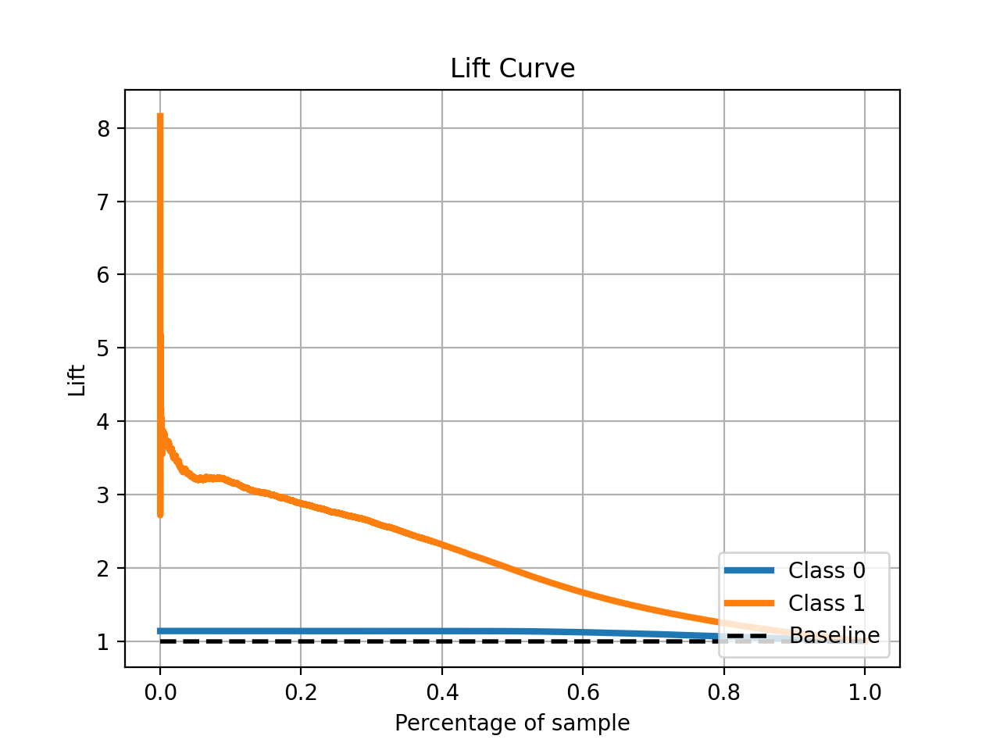

In [101]:
skplt.metrics.plot_cumulative_gain( y_teste, yhat_proba_xgb_final )
skplt.metrics.plot_lift_curve( y_teste, yhat_proba_xgb_final )

In [102]:
df_perf_final = df_teste.copy()
df_perf_final['score_xgb_final'] = yhat_proba_xgb_final[:,1].tolist()
precision_recall_at_k(df_perf_final,k=22866, proba='score_xgb_final', model = 'XGB_final')

,model,ranking,precision_at_k,recall_at_k
22865,XGB_final,22866,0.322138,0.788482


######  A recall at k (22866 - 30% da base)  do nosso modelo com dados nunca vistos foi de 0.788482, superior ao recall at k (9146 - 30%) de  0.783711 visto durante o cross validation do nosso modelo usando dados de treino e validação. Desta forma seguiremos com esse modelo para produção.

In [103]:
# save production model
pickle.dump(model_xgb_final, open('model/xgbclassifier_final_model.pkl', 'wb'))

## 8.0 Tradução e interpretação do erro

Nesta seção demonstraremos como nosso modelo pode ser impactante no faturamento da empresa.

Como hipótese, diremos que nossa empresa tem a capacidade de realizar 18000 ligações dentro deste mês para a venda do seguro. Com isso usaremos 2 casos de estudo, o primeiro, será a realização da escolha de forma aleatória e a segunda será utilizando o nosso algoritmo para rankeamento e pegando os 18000 primeiros.

### Escolha de 18000 pessoas aleatórias

In [123]:
df_aleatorio = df_teste.sample(18000)
df_aleatorio

,id,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response,gender_Female,gender_Male
118252,118253,0.292308,1,0.115085,0,2,1,-1.932646,0.189079,0.456747,1,0,1
18852,18853,0.369231,1,0.187042,0,3,1,-1.932646,0.199689,0.968858,1,1,0
310532,310533,0.061538,1,0.095217,0,1,1,-0.098870,0.028815,0.972318,0,1,0
305278,305279,0.523077,1,0.164263,1,2,0,-0.255053,0.199689,0.608997,0,0,1
8300,8301,0.415385,1,0.124223,0,2,1,0.185638,0.199689,0.764706,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
155328,155329,0.046154,1,0.102291,1,1,0,0.081582,0.028815,0.269896,0,0,1
377502,377503,0.476923,1,0.084509,1,2,0,0.299535,0.199689,0.259516,0,0,1
271149,271150,0.507692,1,0.187042,0,2,1,-1.932646,0.212110,0.173010,0,0,1
336271,336272,0.123077,1,0.187042,1,1,0,2.197673,0.028815,0.660900,0,0,1


In [124]:
df_aleatorio['response'].sum()

2224

No formato aleatório foi possivel conseguir 2224 pessoas interessadas, sendo o ticket médio do seguro no valor aproximado de 30564 unidades monetárias, podemos pontuar que haveria um faturamento de **67.974.336**


### Escolha das 18000 pessoas iniciais do dataset rankeado usando o modelo de ML

In [137]:
df_rankeado = df_perf_final.sort_values(by='score_xgb_final', ascending = False).head(18000)
df_rankeado

,id,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,response,gender_Female,gender_Male,score_xgb_final
203920,203921,0.415385,1,0.187042,0,2,1,5.071077,0.199689,0.664360,1,1,0,0.930292
229652,229653,0.184615,1,0.070207,0,2,1,-1.932646,0.308419,0.996540,0,0,1,0.929026
347761,347762,0.430769,1,0.095217,0,2,1,5.170612,0.199689,0.280277,0,1,0,0.926669
7349,7350,0.461538,1,0.187042,0,2,1,5.071077,0.199689,0.629758,1,0,1,0.923320
99105,99106,0.184615,1,0.124223,0,2,1,-0.547540,0.308419,0.799308,1,0,1,0.921791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
138389,138390,0.507692,1,0.118155,0,2,1,-0.139495,0.199689,0.325260,0,0,1,0.764542
58948,58949,0.523077,1,0.118155,0,3,1,-0.154721,0.199689,0.418685,0,0,1,0.764542
216622,216623,0.507692,1,0.187042,0,2,1,1.674601,0.189079,0.318339,0,0,1,0.764540
377574,377575,0.523077,1,0.187042,0,2,1,1.802593,0.189079,0.432526,0,1,0,0.764540


In [144]:
df_rankeado['response'].sum()

6151

Usando nosso modelo foi possivel ligar para 6151 pessoas interessadas, o que nos daria um faturamento de **187.999.164**. Um acrescimo de **120.024.828** no nosso faturamento total, o equivalente a **176%** de aumento.

## 9.0 Deploy

### 9.1 Propensao Class

In [30]:
import pickle
import inflection
import pandas as pd

class Propensao( object ):
    def __init__ (self):
        self.home_path = '/Users/Rafael/Desktop/Programacao/repos/propensao_compra/'
        self.annual_premium_scaler    = pickle.load (open (self.home_path + 'pkl/annual_premium_scaler.pkl', 'rb') )
        self.age_scaler               = pickle.load (open (self.home_path + 'pkl/age_scaler.pkl', 'rb') )
        self.vintage_scaler           = pickle.load (open (self.home_path + 'pkl/vintage_scaler.pkl', 'rb') )
        self.region_code_encoder      = pickle.load (open (self.home_path + 'pkl/region_code_encoder.pkl', 'rb') )
        self.vehicle_damage_encoder   = pickle.load (open (self.home_path + 'pkl/vehicle_damage_encoder.pkl', 'rb') )
        self.sales_channel_encoder    = pickle.load (open (self.home_path + 'pkl/sales_channel_encoder.pkl', 'rb') )
        
        
    def data_cleaning(self, df1):    
        #Rename columns
        old_cols = ['id', 'Gender', 'Age', 'Driving_License', 'Region_Code',
       'Previously_Insured', 'Vehicle_Age', 'Vehicle_Damage', 'Annual_Premium',
       'Policy_Sales_Channel', 'Vintage']
        snakecase = lambda x:inflection.underscore(x)
        new_cols = list(map(snakecase, old_cols))
        df1.columns = new_cols
        
        #region_code para int
        df1['region_code'] = df1['region_code'].astype(int)

        #policy_sales_channel para int
        df1['policy_sales_channel'] = df1['policy_sales_channel'].astype(int)
        
        return df1
    
    def data_preparation(self, df3):
        #annual_premium
        df3['annual_premium'] = self.annual_premium_scaler.transform( df3[['annual_premium']].values )
       
        #age
        df3['age'] = self.age_scaler.transform( df3[['age']].values )
        
        #vintage
        df3['vintage'] = self.vintage_scaler.transform( df3[['vintage']].values )

        #gender - one hot encoding
        df3 = pd.get_dummies(df3,prefix='gender',columns=['gender'])

        #region_code - target encoder
        df3['region_code'] = self.region_code_encoder.transform(df3['region_code'])

        #vehicle_age - Ordinal encoder
        mapping = {"< 1 Year": 1,  "1-2 Year": 2, "> 2 Years": 3}
        df3['vehicle_age'] = df3['vehicle_age'].map(mapping)

        #vehicle_damage - Label Encoder
        df3['vehicle_damage'] = self.vehicle_damage_encoder.transform( df3['vehicle_damage'].values)

        #policy_sales_channel - Target encoder
        df3['policy_sales_channel'] = self.sales_channel_encoder.transform(df3['policy_sales_channel'])
        
        fs_cols = ['vintage', 'annual_premium', 'age', 'region_code',
           'policy_sales_channel', 'vehicle_damage', 'previously_insured']
    
        return df3[fs_cols]
    
    def get_predict(self, model, original_data, test_data):
        #predict
        pred = model.predict_proba(test_data)
        original_data['score'] = pred[:,1].tolist()
        original_data = original_data.sort_values('score', ascending = False) 
        
        return original_data.to_json(orient = 'records')

### 9.2 API Handler

In [1]:
import pandas as pd
import pickle
from flask import Flask, request, Response
from propensao.Propensao import Propensao

#carregar modelo
model = pickle.load (open ('/Users/Rafael/Desktop/Programacao/repos/propensao_compra/model/xgbclassifier_final_model.pkl', 'rb') )

app = Flask (__name__)

@app.route('/propensao/predict', methods=['POST'])
def propensao_predict():
    test_json = request.get_json()

    if test_json: 
        if isinstance( test_json, dict ):
            test_raw = pd.DataFrame( test_json, index=[0] )
            
        else: 
            test_raw = pd.DataFrame( test_json, columns=test_json[0].keys() )
   
    
        pipeline = Propensao() 
        
        #cleaning
        df1 = pipeline.data_cleaning(test_raw)
        
        #preparation
        df2 = pipeline.data_preparation(df1)
        
        #prediction
        df_response = pipeline.get_predict(model, test_raw, df2 )
        
        return df_response
    
    else:
        return Response('{}', status=200, mimetype='application/json')
    
if __name__ == '__main__':
    app.run ('0.0.0.0')
    

ModuleNotFoundError: No module named 'propensao'

### 9.3 API Test

In [3]:
df_api = pd.read_csv('data/df_test_split.csv',index_col=0)

In [4]:
df_api.drop('response', inplace = True, axis = 1)

In [5]:
data = json.dumps(df_api.to_dict(orient = 'records'))

In [6]:
#url =  'http://127.0.0.1:5000/propensao/predict'
url = 'https://web-api-propensao.onrender.com/propensao/predict'
header = {'Content-type': 'application/json'}
data = data

r = requests.post(url,data = data,headers = header)
print('Status Code {}'.format(r.status_code))

Status Code 200


In [7]:
df_predict = pd.DataFrame(r.json(), columns = r.json()[0].keys())

In [13]:
df_predict

,id,gender,age,driving_license,region_code,previously_insured,vehicle_age,vehicle_damage,annual_premium,policy_sales_channel,vintage,score
0,203921,Female,0.415385,1,28,0,1-2 Year,Yes,5.071077,26,0.664360,0.930292
1,229653,Male,0.184615,1,6,0,1-2 Year,Yes,-1.932646,163,0.996540,0.929026
2,347762,Female,0.430769,1,8,0,1-2 Year,Yes,5.170612,26,0.280277,0.926669
3,7350,Male,0.461538,1,28,0,1-2 Year,Yes,5.071077,26,0.629758,0.923320
4,99106,Male,0.184615,1,41,0,1-2 Year,Yes,-0.547540,163,0.799308,0.921791
...,...,...,...,...,...,...,...,...,...,...,...,...
76217,254915,Female,0.723077,1,50,1,1-2 Year,No,-0.079588,152,0.290657,0.000284
76218,221741,Female,0.753846,1,50,1,1-2 Year,No,-1.932646,160,0.245675,0.000202
76219,166227,Male,0.646154,1,25,1,1-2 Year,No,0.609641,152,0.332180,0.000160
76220,28417,Male,0.723077,1,50,1,1-2 Year,No,0.726330,152,0.747405,0.000156
